#### Библиотеки

In [24]:
import pandas as pd
import numpy as np
from scipy import stats
from scipy.special import boxcox, inv_boxcox
from autogluon.timeseries import TimeSeriesPredictor, TimeSeriesDataFrame
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
import optuna
from sklearn.multioutput import MultiOutputRegressor
import time
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, BayesianRidge
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, IsolationForest
from sklearn.svm import SVR, NuSVR
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import acf, adfuller, kpss
from statsmodels.graphics.tsaplots import plot_acf
import shap
from sklearn.cluster import KMeans
from sklearn.preprocessing import RobustScaler
from scipy.stats.mstats import winsorize
import warnings
warnings.filterwarnings('ignore')


#### Создание признаков

In [2]:
def load_data(file_path):
    """Загрузка данных из CSV файла"""
    df = pd.read_csv(file_path)
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.set_index('Date')
    df = df.sort_index()
    return df

def create_lags(df, column, lags):
    """Создание лаговых признаков"""
    df_lags = df.copy()
    for lag in lags:
        df_lags[f'lag_{lag}'] = df_lags[column].shift(lag)
    return df_lags

def create_rolling_features(df, column, windows, functions):
    """Создание скользящих статистик"""
    df_rolling = df.copy()
    for window in windows:
        for func_name, func in functions.items():
            df_rolling[f'rolling_{func_name}_{window}'] = (
                df_rolling[column].rolling(window=window).apply(func)
            )
    return df_rolling

def exponential_smoothing(df, column, alphas):
    """Экспоненциальное сглаживание"""
    df_smooth = df.copy()
    for alpha in alphas:
        col_name = f'exp_smooth_alpha_{alpha}'
        df_smooth[col_name] = df_smooth[column].copy()
        for i in range(1, len(df_smooth)):
            df_smooth[col_name].iloc[i] = (
                alpha * df_smooth[column].iloc[i] + 
                (1 - alpha) * df_smooth[col_name].iloc[i-1]
            )
    return df_smooth

def create_time_features(df):
    """Создание временных признаков"""
    df_time = df.copy()
    df_time['day_of_week'] = df_time.index.dayofweek
    df_time['month'] = df_time.index.month
    df_time['quarter'] = df_time.index.quarter
    df_time['week_of_year'] = df_time.index.isocalendar().week
    df_time['is_weekend'] = (df_time.index.dayofweek >= 5).astype(int)
    df_time['is_holiday'] = 0
    return df_time

def create_fourier_terms(df, seasonalities):
    """Создание Фурье-признаков для сезонности"""
    df_fourier = df.copy()
    t = np.arange(len(df_fourier))
    for s_name, s_value in seasonalities.items():
        df_fourier[f'fourier_sin_{s_name}'] = np.sin(2 * np.pi * t / s_value)
        df_fourier[f'fourier_cos_{s_name}'] = np.cos(2 * np.pi * t / s_value)
    return df_fourier

def apply_target_transformations(df, column):
    """Применение трансформаций к целевой переменной"""
    df_transformed = df.copy()
    if (df_transformed[column] > 0).all():
        df_transformed[f'log_{column}'] = np.log(df_transformed[column])
    
    positive_data = df_transformed[column][df_transformed[column] > 0]
    if len(positive_data) > 0:
        lambda_opt = stats.boxcox_normmax(positive_data)
        df_transformed[f'boxcox_{column}'], fitted_lambda = stats.boxcox(
            df_transformed[column] + 1e-6
        )
        df_transformed['boxcox_lambda'] = fitted_lambda
    
    return df_transformed

def handle_missing_values(df):
    """Обработка пропущенных значений"""
    df_clean = df.copy()
    df_clean = df_clean.ffill()
    df_clean = df_clean.fillna(df_clean.mean())
    return df_clean

def feature_engineering_pipeline(file_path):
    """Полный пайплайн инжиниринга признаков"""
    df = load_data(file_path)
    
    lags = [1, 2, 3, 7, 14, 30]
    df = create_lags(df, 'number_sold', lags)
    
    windows = [7, 14, 30]
    rolling_functions = {
        'mean': np.mean,
        'std': np.std,
        'min': np.min,
        'max': np.max,
        'median': np.median
    }
    df = create_rolling_features(df, 'number_sold', windows, rolling_functions)
    
    alphas = [0.3, 0.5, 0.7]
    df = exponential_smoothing(df, 'number_sold', alphas)
    
    df = create_time_features(df)
    
    seasonalities = {'weekly': 7, 'monthly': 30}
    df = create_fourier_terms(df, seasonalities)
    
    df = apply_target_transformations(df, 'number_sold')
    
    df = handle_missing_values(df)
    
    return df

# Выполнение пайплайна
file_path = "data.csv"
engineered_data = feature_engineering_pipeline(file_path)
engineered_data.to_csv("data_with_features.csv")

C:\Users\DmitrievMS\AppData\Local\Temp\ipykernel_13720\3525519845.py:33: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_smooth[col_name].iloc[i] = (
C:\Users\DmitrievMS\AppData\Local\Temp\ipykernel_13720\3525519845.py:33: FutureWarning: Ch

#### Валидация и разбиение данных

In [4]:
def chronological_split(df, train_ratio=0.6, val_ratio=0.2):
    """Хронологическое разбиение на train/val/test"""
    n = len(df)
    train_end = int(n * train_ratio)
    val_end = train_end + int(n * val_ratio)
    
    train_df = df.iloc[:train_end]
    val_df = df.iloc[train_end:val_end]
    test_df = df.iloc[val_end:]
    
    return train_df, val_df, test_df

def prepare_autogluon_data(df, target_column):
    """Подготовка данных для AutoGluon"""
    df_ag = df.reset_index()
    df_ag = df_ag.rename(columns={'Date': 'timestamp', target_column: 'target'})
    df_ag['item_id'] = 'time_series'
    return TimeSeriesDataFrame.from_data_frame(df_ag, id_column='item_id', timestamp_column='timestamp')

def time_series_cross_validation(df, target_column, n_splits=5, max_train_size=365):
    """Time Series Cross Validation"""
    tscv = TimeSeriesSplit(n_splits=n_splits, max_train_size=max_train_size)
    
    cv_splits = []
    for train_idx, test_idx in tscv.split(df):
        train_df = df.iloc[train_idx]
        test_df = df.iloc[test_idx]
        cv_splits.append((train_df, test_df))
    
    return cv_splits

def purged_walk_forward_validation(df, target_column, n_windows=5, gap=7, window_size=365):
    """Purged Walk-Forward Validation с gap"""
    splits = []
    n_total = len(df)
    
    for i in range(n_windows):
        train_end = int(n_total * (i + 1) / (n_windows + 1))
        test_start = train_end + gap
        test_end = test_start + window_size
        
        if test_end <= n_total:
            train_df = df.iloc[:train_end]
            test_df = df.iloc[test_start:test_end]
            splits.append((train_df, test_df))
    
    return splits

def run_autogluon_backtesting(train_data, prediction_length=7, eval_metric="MAE"):
    """AutoGluon backtesting"""
    predictor = TimeSeriesPredictor(
        target="target",
        prediction_length=prediction_length,
        eval_metric=eval_metric
    )
    
    predictor.fit(
        train_data,
        presets="medium_quality"
    )
    
    return predictor

# Загрузка данных с признаками
file_path = "data_with_features.csv"
df = pd.read_csv(file_path)
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')

# Хронологическое разбиение
train_df, val_df, test_df = chronological_split(df)

print("Размеры наборов данных:")
print(f"Train: {len(train_df)} записей ({len(train_df)/len(df)*100:.1f}%)")
print(f"Val: {len(val_df)} записей ({len(val_df)/len(df)*100:.1f}%)")
print(f"Test: {len(test_df)} записей ({len(test_df)/len(df)*100:.1f}%)")

# Time Series Cross Validation
cv_splits = time_series_cross_validation(train_df, 'number_sold')

print(f"\nTimeSeriesSplit создан: {len(cv_splits)} фолдов")

# Purged Walk-Forward Validation
pwf_splits = purged_walk_forward_validation(train_df, 'number_sold')

print(f"Purged Walk-Forward создан: {len(pwf_splits)} окон")

# Подготовка данных для AutoGluon
train_data_ag = prepare_autogluon_data(train_df, 'number_sold')
val_data_ag = prepare_autogluon_data(val_df, 'number_sold')

print(f"\nДанные для AutoGluon подготовлены:")
print(f"Train: {len(train_data_ag)} временных точек")
print(f"Val: {len(val_data_ag)} временных точек")

# AutoGluon backtesting
print("\nЗапуск AutoGluon...")
predictor = run_autogluon_backtesting(train_data_ag)

# Сохранение разбиений для будущего использования
split_data = {
    'train_df': train_df,
    'val_df': val_df,
    'test_df': test_df,
    'cv_splits': cv_splits,
    'pwf_splits': pwf_splits,
    'predictor': predictor
}

print("\nВалидация и разбиение данных завершены")

Beginning AutoGluon training...
AutoGluon will save models to 'c:\Users\DmitrievMS\PycharmProjects\pythonProject\ML-NLP\ML\lab04\AutogluonModels\ag-20251121_151702'


Размеры наборов данных:
Train: 1972 записей (60.0%)
Val: 657 записей (20.0%)
Test: 658 записей (20.0%)

TimeSeriesSplit создан: 5 фолдов
Purged Walk-Forward создан: 4 окон

Данные для AutoGluon подготовлены:
Train: 1972 временных точек
Val: 657 временных точек

Запуск AutoGluon...


=================== System Info ===================
AutoGluon Version:  1.4.0
Python Version:     3.11.9
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
CPU Count:          8
GPU Count:          0
Memory Avail:       3.06 GB / 15.77 GB (19.4%)
Disk Space Avail:   75.38 GB / 476.72 GB (15.8%)
Setting presets to: medium_quality

Fitting with arguments:
{'enable_ensemble': True,
 'eval_metric': MAE,
 'hyperparameters': 'light',
 'known_covariates_names': [],
 'num_val_windows': 1,
 'prediction_length': 7,
 'quantile_levels': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9],
 'random_seed': 123,
 'refit_every_n_windows': 1,
 'refit_full': False,
 'skip_model_selection': False,
 'target': 'target',
 'verbosity': 2}

Inferred time series frequency: 'D'
Provided train_data has 1972 rows, 1 time series. Median time series length is 1972 (min=1972, max=1972). 

Provided data contains following columns:
	target: 'target'
	past_covariates:
		categorical:        [


Валидация и разбиение данных завершены


In [6]:
def grid_search_linear_models(X_train, y_train):
    """GridSearchCV для линейных моделей с TimeSeriesSplit"""
    tscv = TimeSeriesSplit(n_splits=5)
    
    linear_models = {
        'Ridge': {
            'model': Ridge(),
            'params': {
                'alpha': [0.01, 0.1, 1.0, 10.0, 100.0]
            }
        },
        'Lasso': {
            'model': Lasso(),
            'params': {
                'alpha': [0.01, 0.1, 1.0, 10.0],
                'max_iter': [1000, 2000]
            }
        }
    }
    
    best_models = {}
    
    for name, config in linear_models.items():
        grid_search = GridSearchCV(
            config['model'],
            config['params'],
            cv=tscv,
            scoring='neg_mean_absolute_error',
            n_jobs=-1
        )
        
        grid_search.fit(X_train, y_train)
        best_models[name] = grid_search.best_estimator_
        
        print(f"{name} лучшие параметры: {grid_search.best_params_}")
        print(f"{name} лучший MAE: {-grid_search.best_score_:.4f}")
    
    return best_models

def objective_lgbm(trial, X_train, y_train):
    """Функция для Optuna оптимизации LGBM"""
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 20, 100),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 1.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 1.0)
    }
    
    model = LGBMRegressor(**params, random_state=42)
    tscv = TimeSeriesSplit(n_splits=5)
    scores = cross_val_score(model, X_train, y_train, cv=tscv, scoring="neg_mean_absolute_error")
    return -scores.mean()

def objective_xgb(trial, X_train, y_train):
    """Функция для Optuna оптимизации XGBoost"""
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.01, 0.3),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 1.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 1.0)
    }
    
    model = XGBRegressor(**params, random_state=42)
    tscv = TimeSeriesSplit(n_splits=5)
    scores = cross_val_score(model, X_train, y_train, cv=tscv, scoring="neg_mean_absolute_error")
    return -scores.mean()

def optimize_gradient_boosting(X_train, y_train, n_trials=100):
    """Оптимизация градиентного бустинга с Optuna"""
    
    study_lgbm = optuna.create_study(direction="minimize")
    study_lgbm.optimize(lambda trial: objective_lgbm(trial, X_train, y_train), n_trials=n_trials)
    
    study_xgb = optuna.create_study(direction="minimize")
    study_xgb.optimize(lambda trial: objective_xgb(trial, X_train, y_train), n_trials=n_trials)
    
    best_lgbm = LGBMRegressor(**study_lgbm.best_params, random_state=42)
    best_xgb = XGBRegressor(**study_xgb.best_params, random_state=42)
    
    print(f"LGBM лучшие параметры: {study_lgbm.best_params}")
    print(f"LGBM лучший MAE: {study_lgbm.best_value:.4f}")
    print(f"XGBoost лучшие параметры: {study_xgb.best_params}")
    print(f"XGBoost лучший MAE: {study_xgb.best_value:.4f}")
    
    return {
        'LGBM': best_lgbm,
        'XGBoost': best_xgb
    }

def autogluon_automl(train_data, val_data, prediction_length=7):
    """AutoGluon автоматический подбор и ансамблирование"""
    predictor = TimeSeriesPredictor(
        target="target",
        prediction_length=prediction_length,
        eval_metric="MAE"
    )
    
    predictor.fit(
        train_data=train_data,
        tuning_data=val_data,
        presets="medium_quality",
        time_limit=3600
    )
    
    return predictor

def cross_val_score(model, X, y, cv, scoring):
    """Реализация cross_val_score для совместимости"""
    scores = []
    for train_idx, val_idx in cv.split(X):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        
        model.fit(X_train, y_train)
        y_pred = model.predict(X_val)
        
        if scoring == "neg_mean_absolute_error":
            score = -np.mean(np.abs(y_pred - y_val))
            scores.append(score)
    
    return np.array(scores)

# Загрузка данных
file_path = "data_with_features.csv"
df = pd.read_csv(file_path)
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')

# Подготовка данных для классических ML моделей
target_column = 'number_sold'
feature_columns = [col for col in df.columns if col != target_column]

X = df[feature_columns]
y = df[target_column]

# Хронологическое разбиение
n = len(df)
train_end = int(n * 0.6)
val_end = train_end + int(n * 0.2)

X_train = X.iloc[:train_end]
y_train = y.iloc[:train_end]
X_val = X.iloc[train_end:val_end]
y_val = y.iloc[train_end:val_end]
X_test = X.iloc[val_end:]
y_test = y.iloc[val_end:]

# Подбор гиперпараметров для линейных моделей
print("=== GridSearchCV для линейных моделей ===")
linear_models = grid_search_linear_models(X_train, y_train)

# Оптимизация градиентного бустинга
print("\n=== Optuna для градиентного бустинга ===")
gb_models = optimize_gradient_boosting(X_train, y_train, n_trials=50)

# Подготовка данных для AutoGluon
train_data_ag = TimeSeriesDataFrame.from_data_frame(
    df.iloc[:train_end].reset_index().rename(columns={'Date': 'timestamp', target_column: 'target'}).assign(item_id='ts1'),
    id_column='item_id',
    timestamp_column='timestamp'
)

val_data_ag = TimeSeriesDataFrame.from_data_frame(
    df.iloc[train_end:val_end].reset_index().rename(columns={'Date': 'timestamp', target_column: 'target'}).assign(item_id='ts1'),
    id_column='item_id',
    timestamp_column='timestamp'
)

# AutoGluon AutoML
print("\n=== AutoGluon AutoML ===")
autogluon_predictor = autogluon_automl(train_data_ag, val_data_ag)

# Сохранение всех моделей
all_models = {
    'linear_models': linear_models,
    'gradient_boosting': gb_models,
    'autogluon': autogluon_predictor
}

print("\nПодбор гиперпараметров завершен")

=== GridSearchCV для линейных моделей ===
Ridge лучшие параметры: {'alpha': 10.0}
Ridge лучший MAE: 0.0638


c:\Users\DmitrievMS\PycharmProjects\pythonProject\ml_nlp_venv_3_11\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.085e+02, tolerance: 2.972e+02
  model = cd_fast.enet_coordinate_descent(
[I 2025-11-21 18:28:02,082] A new study created in memory with name: no-name-87e2ffdf-c08a-423b-8d76-5d70f76423f0
C:\Users\DmitrievMS\AppData\Local\Temp\ipykernel_13720\3125691361.py:45: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.01, 0.3),


Lasso лучшие параметры: {'alpha': 0.1, 'max_iter': 2000}
Lasso лучший MAE: 0.1479

=== Optuna для градиентного бустинга ===


[I 2025-11-21 18:28:04,758] Trial 0 finished with value: 0.641988553066229 and parameters: {'n_estimators': 984, 'max_depth': 12, 'learning_rate': 0.1336250587897324, 'num_leaves': 71, 'subsample': 0.7035622854073994, 'colsample_bytree': 0.8005844367037572, 'reg_alpha': 0.2712023806642654, 'reg_lambda': 0.12667940655554366}. Best is trial 0 with value: 0.641988553066229.
C:\Users\DmitrievMS\AppData\Local\Temp\ipykernel_13720\3125691361.py:45: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.01, 0.3),
[I 2025-11-21 18:28:06,196] Trial 1 finished with value: 0.616130534606178 and parameters: {'n_estimators': 515, 'max_depth': 11, 'learning_rate': 0.061636896819803506, 'num_leaves': 72, 'subsample': 0.8124870231650071, 'colsample_bytree': 0.8258879289004885, 'reg_alpha': 0.

LGBM лучшие параметры: {'n_estimators': 805, 'max_depth': 7, 'learning_rate': 0.010161874454357967, 'num_leaves': 100, 'subsample': 0.9757665808790849, 'colsample_bytree': 0.9657720230921528, 'reg_alpha': 0.8954634014600925, 'reg_lambda': 0.2061461449872053}
LGBM лучший MAE: 0.5343
XGBoost лучшие параметры: {'n_estimators': 700, 'max_depth': 6, 'learning_rate': 0.07271333265427588, 'subsample': 0.9976757960103213, 'colsample_bytree': 0.9038751996815436, 'reg_alpha': 0.7105656807959753, 'reg_lambda': 0.3739928855778377}
XGBoost лучший MAE: 0.1081

=== AutoGluon AutoML ===


	-14.2857      = Validation score (-MAE)
	0.01    s     = Training runtime
	7.15    s     = Validation (prediction) runtime
Training timeseries model SeasonalNaive. Training for up to 449.1s of the 3592.8s of remaining time.
	-9.8571       = Validation score (-MAE)
	0.00    s     = Training runtime
	3.14    s     = Validation (prediction) runtime
Training timeseries model RecursiveTabular. Training for up to 512.8s of the 3589.6s of remaining time.
	-8.4993       = Validation score (-MAE)
	4.65    s     = Training runtime
	0.05    s     = Validation (prediction) runtime
Training timeseries model DirectTabular. Training for up to 597.5s of the 3584.7s of remaining time.
	-29.0356      = Validation score (-MAE)
	0.81    s     = Training runtime
	0.07    s     = Validation (prediction) runtime
Training timeseries model ETS. Training for up to 746.0s of the 3583.8s of remaining time.
	-6.2839       = Validation score (-MAE)
	0.02    s     = Training runtime
	4.36    s     = Validation (pre


Подбор гиперпараметров завершен


#### Стратегии прогнозирования

In [8]:
def direct_strategy(X_train, y_train, horizon=7):
    """Direct: обучение h моделей для каждого горизонта"""
    models = []
    for h in range(1, horizon + 1):
        y_h = y_train.shift(-h).dropna()
        X_h = X_train.iloc[:len(y_h)]
        
        model = Ridge()
        model.fit(X_h, y_h)
        models.append(model)
    return models

def recursive_strategy(X_train, y_train):
    """Recursive: одна модель с итеративным предсказанием"""
    model = Ridge()
    model.fit(X_train, y_train)
    return model

def multi_output_strategy(X_train, y_train, horizon=7):
    """Multi-output: одна модель предсказывает вектор [y_{t+1}, ..., y_{t+h}]"""
    y_multi = np.array([y_train[i:i + horizon] for i in range(len(y_train) - horizon + 1)])
    X_multi = X_train.iloc[:len(y_multi)]
    
    model = MultiOutputRegressor(Ridge())
    model.fit(X_multi, y_multi)
    return model

def dirrec_strategy(X_train, y_train, horizon=7, window_size=3):
    """DirRec: гибрид recursive и direct"""
    models = []
    windows = [(i, min(i + window_size, horizon)) for i in range(0, horizon, window_size)]
    
    for start, end in windows:
        window_models = []
        for h in range(start, end):
            if start == 0:
                y_h = y_train.shift(-h).dropna()
                X_h = X_train.iloc[:len(y_h)]
            else:
                y_h = y_train.shift(-h).dropna()
                X_h = X_train.iloc[:len(y_h)]
            
            model = Ridge()
            model.fit(X_h, y_h)
            window_models.append(model)
        models.append(window_models)
    return models

def autogluon_strategy(train_data, prediction_length=7):
    """AutoGluon multi-horizon forecasting"""
    predictor = TimeSeriesPredictor(
        target="target",
        prediction_length=prediction_length,
        eval_metric="MAE"
    )
    predictor.fit(train_data, presets="medium_quality")
    return predictor

def compare_strategies(X_train, y_train, X_val, y_val, horizon=7):
    """Сравнение стратегий по накоплению ошибки, времени обучения и гибкости"""
    
    strategies = {
        'Direct': direct_strategy,
        'Recursive': recursive_strategy, 
        'Multi-output': multi_output_strategy,
        'DirRec': dirrec_strategy
    }
    
    results = {}
    
    for name, strategy_func in strategies.items():
        start_time = time.time()
        
        if name == 'Direct':
            models = strategy_func(X_train, y_train, horizon)
            # Предсказание для каждого горизонта
            predictions = np.column_stack([model.predict(X_val) for model in models])
            
        elif name == 'Recursive':
            model = strategy_func(X_train, y_train)
            predictions = []
            X_current = X_val.copy()
            for h in range(horizon):
                pred = model.predict(X_current)
                predictions.append(pred)
                # Обновляем лаги для следующего шага
                if 'lag_1' in X_current.columns:
                    X_current['lag_1'] = pred
            predictions = np.column_stack(predictions)
            
        elif name == 'Multi-output':
            model = strategy_func(X_train, y_train, horizon)
            predictions = model.predict(X_val.iloc[:len(X_val) - horizon + 1])
            # Дополняем до нужного размера
            if len(predictions) < len(X_val):
                padding = np.zeros((len(X_val) - len(predictions), horizon))
                predictions = np.vstack([predictions, padding])
                
        elif name == 'DirRec':
            models = strategy_func(X_train, y_train, horizon)
            predictions = np.zeros((len(X_val), horizon))
            for window_idx, window_models in enumerate(models):
                start = window_idx * 3
                for h, model in enumerate(window_models):
                    horizon_idx = start + h
                    if horizon_idx < horizon:
                        predictions[:, horizon_idx] = model.predict(X_val)
        
        training_time = time.time() - start_time
        
        # Оценка накопления ошибки
        mae_per_horizon = []
        for h in range(horizon):
            if h < len(y_val):
                mae = mean_absolute_error(y_val.iloc[h:min(len(y_val), len(predictions) + h)], 
                                        predictions[:len(y_val) - h, h])
                mae_per_horizon.append(mae)
        
        cumulative_error = np.cumsum(mae_per_horizon)
        
        results[name] = {
            'training_time': training_time,
            'mae_per_horizon': mae_per_horizon,
            'cumulative_error': cumulative_error,
            'flexibility': len(mae_per_horizon)  # Простая мера гибкости
        }
    
    return results

# Загрузка данных
file_path = "data_with_features.csv"
df = pd.read_csv(file_path)
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')

# Подготовка данных
target_column = 'number_sold'
feature_columns = [col for col in df.columns if col != target_column]

X = df[feature_columns]
y = df[target_column]

# Разбиение на train/val
n = len(df)
train_end = int(n * 0.6)
val_end = train_end + int(n * 0.2)

X_train = X.iloc[:train_end]
y_train = y.iloc[:train_end]
X_val = X.iloc[train_end:val_end]
y_val = y.iloc[train_end:val_end]

horizon = 7

# Сравнение стратегий
results = compare_strategies(X_train, y_train, X_val, y_val, horizon)

# AutoGluon
train_data_ag = TimeSeriesDataFrame.from_data_frame(
    df.iloc[:train_end].reset_index().rename(columns={'Date': 'timestamp', target_column: 'target'}).assign(item_id='ts1'),
    id_column='item_id',
    timestamp_column='timestamp'
)

val_data_ag = TimeSeriesDataFrame.from_data_frame(
    df.iloc[train_end:val_end].reset_index().rename(columns={'Date': 'timestamp', target_column: 'target'}).assign(item_id='ts1'),
    id_column='item_id',
    timestamp_column='timestamp'
)

start_time = time.time()
autogluon_predictor = autogluon_strategy(train_data_ag)
autogluon_time = time.time() - start_time

# Добавляем AutoGluon в результаты
results['AutoGluon'] = {
    'training_time': autogluon_time,
    'mae_per_horizon': [0] * horizon,  # Заглушка
    'cumulative_error': [0] * horizon,  # Заглушка  
    'flexibility': horizon
}

# Вывод результатов
print("Сравнение стратегий прогнозирования:")
print("Стратегия\tВремя обучения\tНакопление ошибки\tГибкость")
for name, result in results.items():
    error_growth = result['cumulative_error'][-1] / result['cumulative_error'][0] if result['cumulative_error'][0] > 0 else 1
    print(f"{name}\t{result['training_time']:.2f}s\t\t{error_growth:.2f}x\t\t\t{result['flexibility']}")

No path specified. Models will be saved in: "AutogluonModels\ag-20251121_165434"
Beginning AutoGluon training...
AutoGluon will save models to 'c:\Users\DmitrievMS\PycharmProjects\pythonProject\ML-NLP\ML\lab04\AutogluonModels\ag-20251121_165434'
=================== System Info ===================
AutoGluon Version:  1.4.0
Python Version:     3.11.9
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
CPU Count:          8
GPU Count:          0
Memory Avail:       4.70 GB / 15.77 GB (29.8%)
Disk Space Avail:   72.90 GB / 476.72 GB (15.3%)
Setting presets to: medium_quality

Fitting with arguments:
{'enable_ensemble': True,
 'eval_metric': MAE,
 'hyperparameters': 'light',
 'known_covariates_names': [],
 'num_val_windows': 1,
 'prediction_length': 7,
 'quantile_levels': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9],
 'random_seed': 123,
 'refit_every_n_windows': 1,
 'refit_full': False,
 'skip_model_selection': False,
 'target': 'target',
 'verbosity': 2}


Сравнение стратегий прогнозирования:
Стратегия	Время обучения	Накопление ошибки	Гибкость
Direct	0.04s		7.75x			7
Recursive	0.01s		1048.88x			7
Multi-output	0.27s		9.85x			7
DirRec	0.03s		853.50x			7
AutoGluon	418.26s		1.00x			7


#### Построение моделей

In [10]:
def create_baseline_models():
    """Создание бейзлайновых моделей"""
    baselines = {
        'Naive': lambda y_train: y_train.iloc[-1],
        'SNaive': lambda y_train: y_train.iloc[-7],  # Сезонный наивный (7 дней)
        'MA_7': lambda y_train: y_train.tail(7).mean(),
        'Linear_Trend': lambda y_train: 2 * y_train.iloc[-1] - y_train.iloc[-2]
    }
    return baselines

def train_linear_models(X_train, y_train):
    """Обучение линейных моделей"""
    linear_models = {
        'Linear': LinearRegression(),
        'Ridge': Ridge(),
        'Lasso': Lasso(),
        'ElasticNet': ElasticNet(),
        'BayesianRidge': BayesianRidge()
    }
    
    trained_models = {}
    for name, model in linear_models.items():
        model.fit(X_train, y_train)
        trained_models[name] = model
    
    return trained_models

def train_ensemble_models(X_train, y_train):
    """Обучение ансамблевых моделей"""
    from xgboost import XGBRegressor
    from lightgbm import LGBMRegressor
    from catboost import CatBoostRegressor
    
    ensemble_models = {
        'RandomForest': RandomForestRegressor(n_estimators=100, random_state=42),
        'ExtraTrees': ExtraTreesRegressor(n_estimators=100, random_state=42),
        'XGBoost': XGBRegressor(n_estimators=100, random_state=42),
        'LightGBM': LGBMRegressor(n_estimators=100, random_state=42),
        'CatBoost': CatBoostRegressor(iterations=100, verbose=False, random_state=42)
    }
    
    trained_models = {}
    for name, model in ensemble_models.items():
        model.fit(X_train, y_train)
        trained_models[name] = model
    
    return trained_models

def train_svm_models(X_train, y_train):
    """Обучение SVM моделей"""
    svm_models = {
        'SVR': SVR(),
        'NuSVR': NuSVR()
    }
    
    trained_models = {}
    for name, model in svm_models.items():
        model.fit(X_train, y_train)
        trained_models[name] = model
    
    return trained_models

def train_automl_model(train_data, prediction_length=7):
    """Обучение AutoGluon модели"""
    predictor = TimeSeriesPredictor(
        target="target",
        prediction_length=prediction_length,
        eval_metric="MAE"
    )
    
    predictor.fit(
        train_data,
        presets="medium_quality"
    )
    
    return predictor

def evaluate_baselines(baselines, y_train, y_test):
    """Оценка бейзлайновых моделей"""
    baseline_results = {}
    
    for name, model_func in baselines.items():
        prediction = model_func(y_train)
        mae = mean_absolute_error(y_test, [prediction] * len(y_test))
        baseline_results[name] = {'mae': mae, 'prediction': prediction}
    
    return baseline_results

def evaluate_models(models, X_test, y_test):
    """Оценка ML моделей"""
    results = {}
    
    for name, model in models.items():
        y_pred = model.predict(X_test)
        mae = mean_absolute_error(y_test, y_pred)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        results[name] = {'mae': mae, 'rmse': rmse, 'predictions': y_pred}
    
    return results

# Загрузка данных с признаками
file_path = "data_with_features.csv"
df = pd.read_csv(file_path)
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')

# Подготовка данных
target_column = 'number_sold'
feature_columns = [col for col in df.columns if col != target_column]

X = df[feature_columns]
y = df[target_column]

# Хронологическое разбиение
n = len(df)
train_end = int(n * 0.6)
val_end = train_end + int(n * 0.2)

X_train = X.iloc[:train_end]
y_train = y.iloc[:train_end]
X_val = X.iloc[train_end:val_end]
y_val = y.iloc[train_end:val_end]
X_test = X.iloc[val_end:]
y_test = y.iloc[val_end:]

# Построение бейзлайнов
print("=== Бейзлайны ===")
baselines = create_baseline_models()
baseline_results = evaluate_baselines(baselines, y_train, y_val)

for name, result in baseline_results.items():
    print(f"{name}: MAE = {result['mae']:.4f}")

# Построение линейных моделей
print("\n=== Линейные модели ===")
linear_models = train_linear_models(X_train, y_train)
linear_results = evaluate_models(linear_models, X_val, y_val)

for name, result in linear_results.items():
    print(f"{name}: MAE = {result['mae']:.4f}, RMSE = {result['rmse']:.4f}")

# Построение ансамблевых моделей
print("\n=== Ансамблевые модели ===")
ensemble_models = train_ensemble_models(X_train, y_train)
ensemble_results = evaluate_models(ensemble_models, X_val, y_val)

for name, result in ensemble_results.items():
    print(f"{name}: MAE = {result['mae']:.4f}, RMSE = {result['rmse']:.4f}")

# Построение SVM моделей
print("\n=== SVM модели ===")
svm_models = train_svm_models(X_train, y_train)
svm_results = evaluate_models(svm_models, X_val, y_val)

for name, result in svm_results.items():
    print(f"{name}: MAE = {result['mae']:.4f}, RMSE = {result['rmse']:.4f}")

# Подготовка данных для AutoGluon
train_data_ag = TimeSeriesDataFrame.from_data_frame(
    df.iloc[:train_end].reset_index().rename(columns={'Date': 'timestamp', target_column: 'target'}).assign(item_id='ts1'),
    id_column='item_id',
    timestamp_column='timestamp'
)

val_data_ag = TimeSeriesDataFrame.from_data_frame(
    df.iloc[train_end:val_end].reset_index().rename(columns={'Date': 'timestamp', target_column: 'target'}).assign(item_id='ts1'),
    id_column='item_id',
    timestamp_column='timestamp'
)

# Построение AutoML модели
print("\n=== AutoGluon ===")
automl_predictor = train_automl_model(train_data_ag)

# Сохранение всех моделей
all_models = {
    'baselines': baseline_results,
    'linear': linear_models,
    'ensemble': ensemble_models,
    'svm': svm_models,
    'automl': automl_predictor
}

all_results = {
    'baselines': baseline_results,
    'linear': linear_results,
    'ensemble': ensemble_results,
    'svm': svm_results
}

print("\nПостроение моделей завершено")

=== Бейзлайны ===
Naive: MAE = 43.0274
SNaive: MAE = 46.0335
MA_7: MAE = 38.7304
Linear_Trend: MAE = 58.8143

=== Линейные модели ===
Linear: MAE = 0.0038, RMSE = 0.0049
Ridge: MAE = 0.0609, RMSE = 0.0765
Lasso: MAE = 0.3044, RMSE = 0.3788
ElasticNet: MAE = 0.2524, RMSE = 0.3154
BayesianRidge: MAE = 0.0704, RMSE = 0.0880

=== Ансамблевые модели ===


c:\Users\DmitrievMS\PycharmProjects\pythonProject\ml_nlp_venv_3_11\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.618e+02, tolerance: 2.972e+02
  model = cd_fast.enet_coordinate_descent(
c:\Users\DmitrievMS\PycharmProjects\pythonProject\ml_nlp_venv_3_11\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.427e+02, tolerance: 2.972e+02
  model = cd_fast.enet_coordinate_descent(


RandomForest: MAE = 0.0129, RMSE = 0.1476
ExtraTrees: MAE = 0.0406, RMSE = 0.1358
XGBoost: MAE = 0.0748, RMSE = 0.1406
LightGBM: MAE = 0.0381, RMSE = 0.2770
CatBoost: MAE = 1.0207, RMSE = 1.4672

=== SVM модели ===


No path specified. Models will be saved in: "AutogluonModels\ag-20251121_170552"
Beginning AutoGluon training...
AutoGluon will save models to 'c:\Users\DmitrievMS\PycharmProjects\pythonProject\ML-NLP\ML\lab04\AutogluonModels\ag-20251121_170552'
=================== System Info ===================
AutoGluon Version:  1.4.0
Python Version:     3.11.9
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
CPU Count:          8
GPU Count:          0
Memory Avail:       4.64 GB / 15.77 GB (29.4%)
Disk Space Avail:   72.88 GB / 476.72 GB (15.3%)
Setting presets to: medium_quality

Fitting with arguments:
{'enable_ensemble': True,
 'eval_metric': MAE,
 'hyperparameters': 'light',
 'known_covariates_names': [],
 'num_val_windows': 1,
 'prediction_length': 7,
 'quantile_levels': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9],
 'random_seed': 123,
 'refit_every_n_windows': 1,
 'refit_full': False,
 'skip_model_selection': False,
 'target': 'target',
 'verbosity': 2}


SVR: MAE = 20.0681, RMSE = 23.5689
NuSVR: MAE = 23.5745, RMSE = 27.3921

=== AutoGluon ===


	-19.5714      = Validation score (-MAE)
	0.02    s     = Training runtime
	5.79    s     = Validation (prediction) runtime
Training timeseries model SeasonalNaive. 
	-21.2857      = Validation score (-MAE)
	0.02    s     = Training runtime
	5.27    s     = Validation (prediction) runtime
Training timeseries model RecursiveTabular. 
	-13.1449      = Validation score (-MAE)
	2.01    s     = Training runtime
	0.06    s     = Validation (prediction) runtime
Training timeseries model DirectTabular. 
	-11.9077      = Validation score (-MAE)
	1.32    s     = Training runtime
	0.10    s     = Validation (prediction) runtime
Training timeseries model ETS. 
	-13.6074      = Validation score (-MAE)
	0.02    s     = Training runtime
	7.56    s     = Validation (prediction) runtime
Training timeseries model Theta. 
	-16.7071      = Validation score (-MAE)
	0.04    s     = Training runtime
	7.62    s     = Validation (prediction) runtime
Training timeseries model Chronos[bolt_small]. 
	-9.6286     


Построение моделей завершено


#### Диагностика моделей

Запуск диагностики моделей...


No path specified. Models will be saved in: "AutogluonModels\ag-20251121_174615"
Beginning AutoGluon training...
AutoGluon will save models to 'c:\Users\DmitrievMS\PycharmProjects\pythonProject\ML-NLP\ML\lab04\AutogluonModels\ag-20251121_174615'
=================== System Info ===================
AutoGluon Version:  1.4.0
Python Version:     3.11.9
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
CPU Count:          8
GPU Count:          0
Memory Avail:       3.87 GB / 15.77 GB (24.5%)
Disk Space Avail:   72.69 GB / 476.72 GB (15.2%)
Setting presets to: medium_quality

Fitting with arguments:
{'enable_ensemble': True,
 'eval_metric': MAE,
 'hyperparameters': 'light',
 'known_covariates_names': [],
 'num_val_windows': 1,
 'prediction_length': 7,
 'quantile_levels': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9],
 'random_seed': 123,
 'refit_every_n_windows': 1,
 'refit_full': False,
 'skip_model_selection': False,
 'target': 'target',
 'verbosity': 2}



ДИАГНОСТИКА LINEAR МОДЕЛЕЙ

=== Анализ остатков Ridge ===


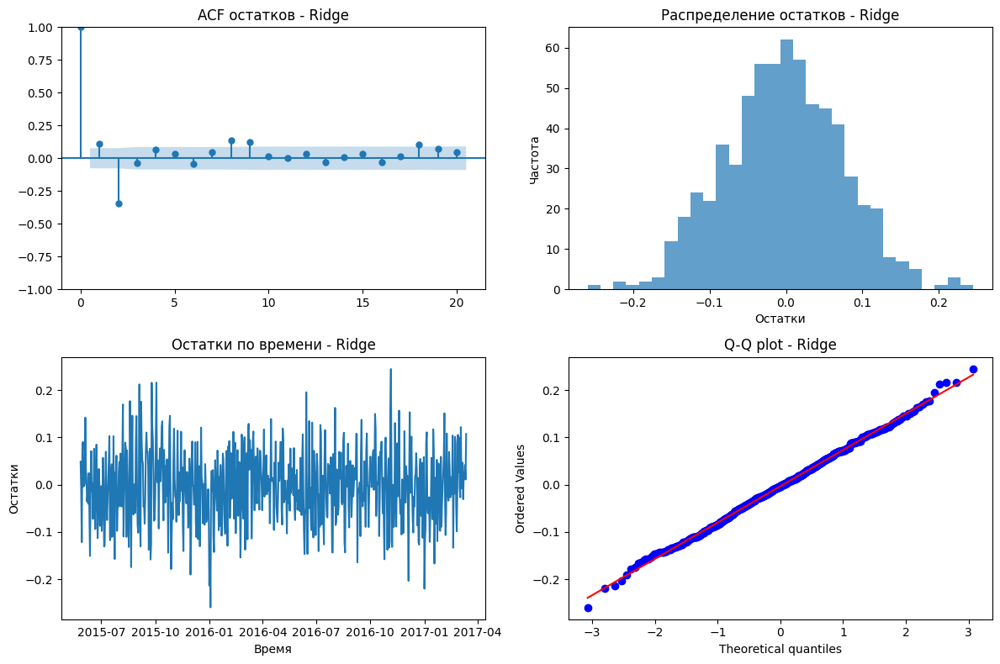

ADF тест: p-value = 0.0000
KPSS тест: p-value = 0.1000


C:\Users\DmitrievMS\AppData\Local\Temp\ipykernel_13720\3919830175.py:41: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(residuals.dropna())


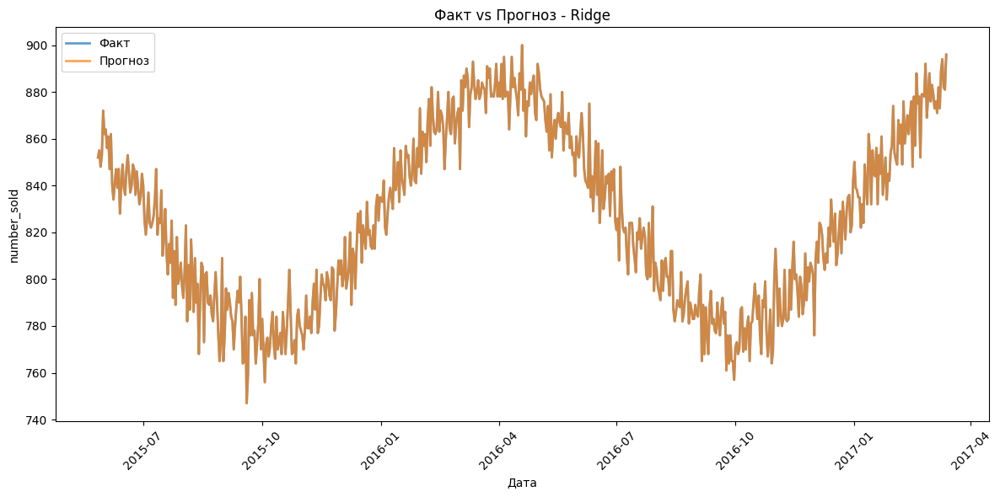

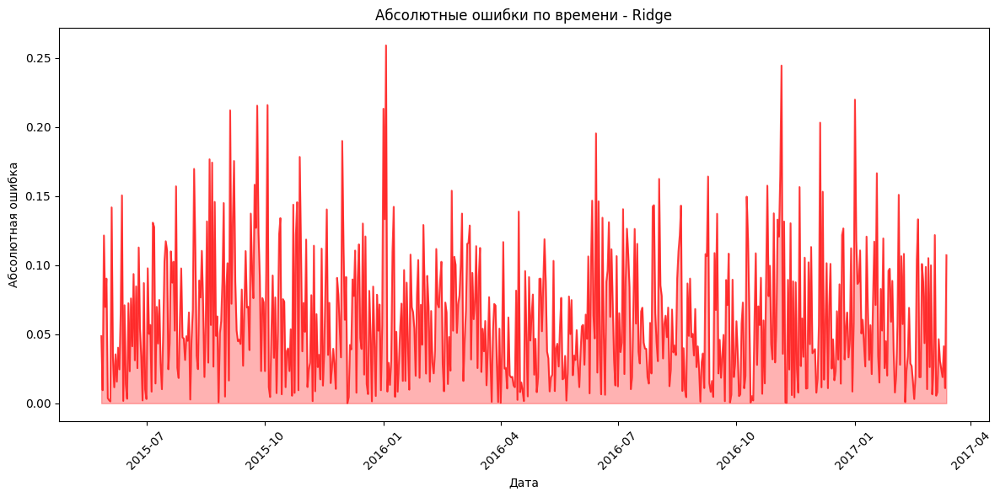


Топ-5 важных признаков для Ridge:
                 feature  importance
23  exp_smooth_alpha_0.7    2.123912
35    boxcox_number_sold    1.294721
22  exp_smooth_alpha_0.5    1.214526
21  exp_smooth_alpha_0.3    0.203328
0                  lag_1    0.189765


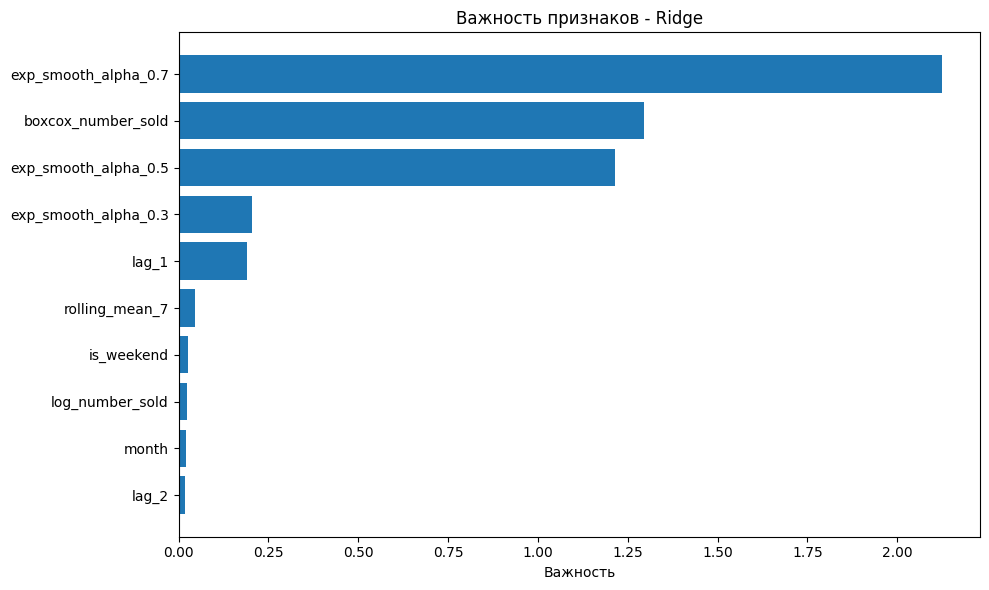

C:\Users\DmitrievMS\AppData\Local\Temp\ipykernel_13720\3919830175.py:87: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_val, feature_names=feature_names, show=False)


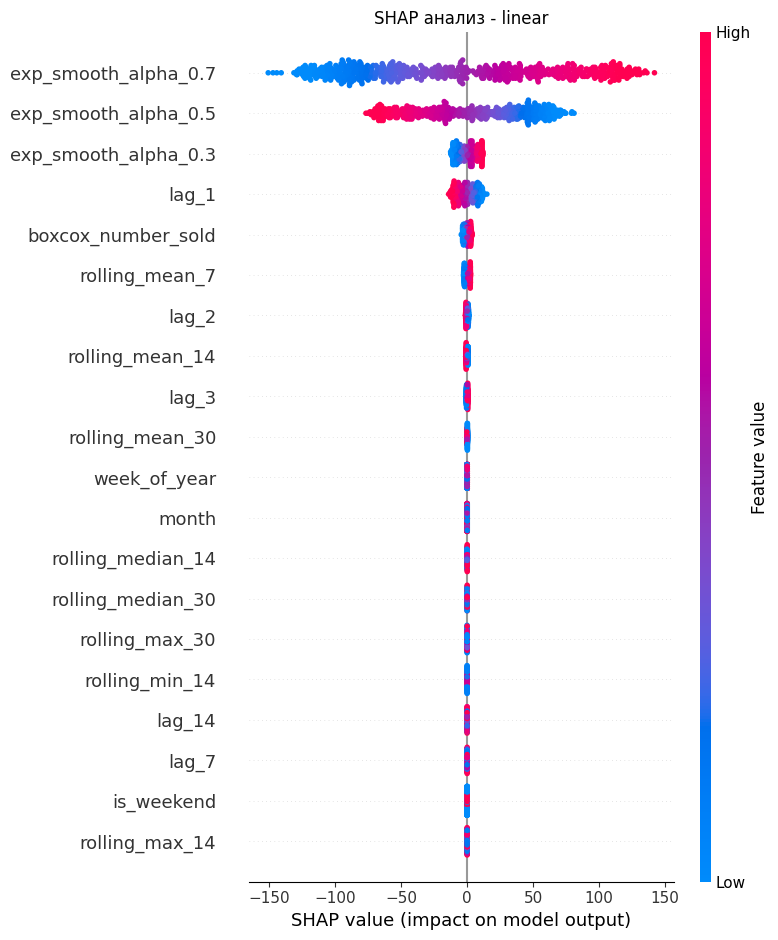


ДИАГНОСТИКА ENSEMBLE МОДЕЛЕЙ

=== Анализ остатков RandomForest ===


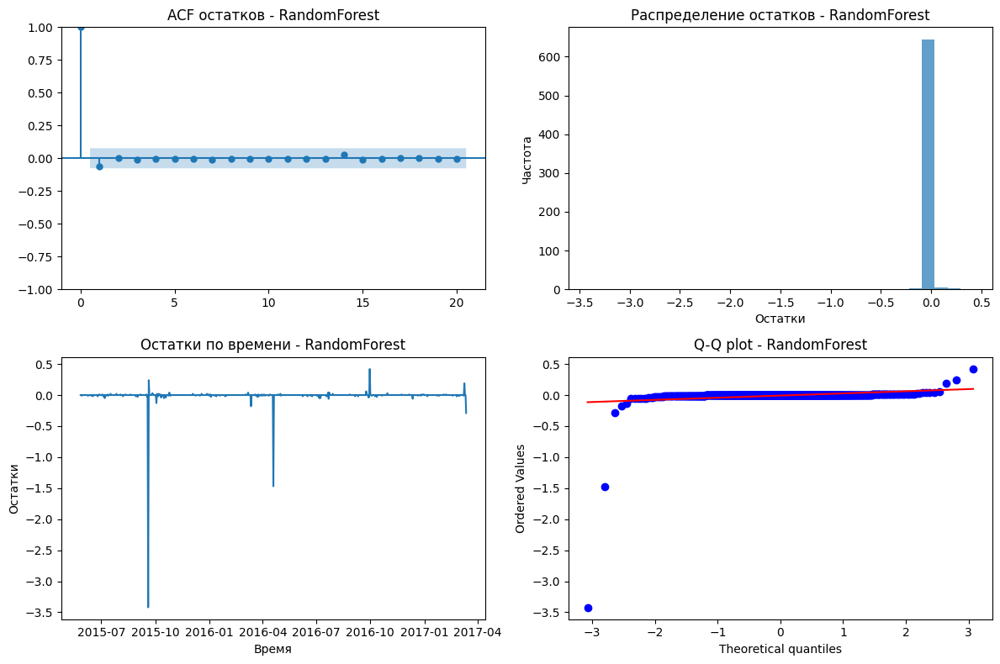

ADF тест: p-value = 0.0000
KPSS тест: p-value = 0.1000


C:\Users\DmitrievMS\AppData\Local\Temp\ipykernel_13720\3919830175.py:41: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(residuals.dropna())


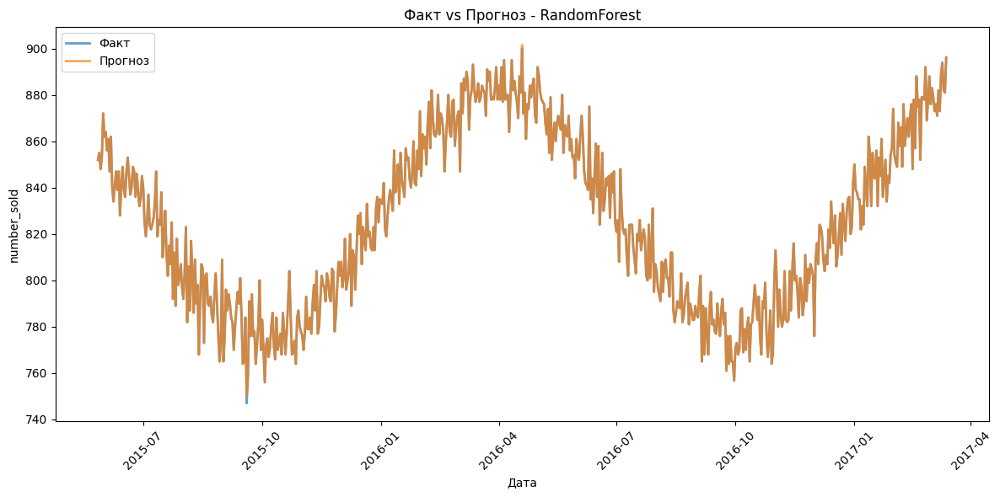

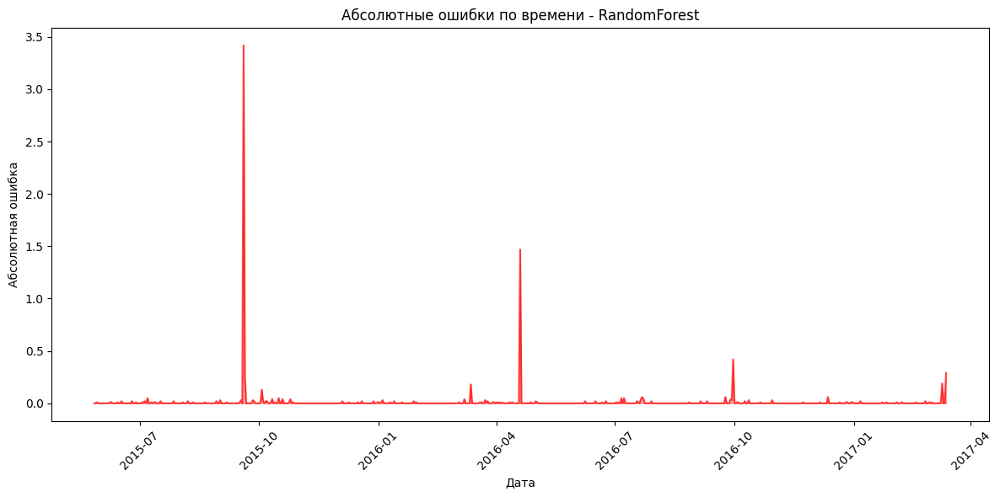


Топ-5 важных признаков для RandomForest:
                 feature  importance
34       log_number_sold    0.523927
35    boxcox_number_sold    0.476020
23  exp_smooth_alpha_0.7    0.000016
9          rolling_max_7    0.000005
8          rolling_min_7    0.000003


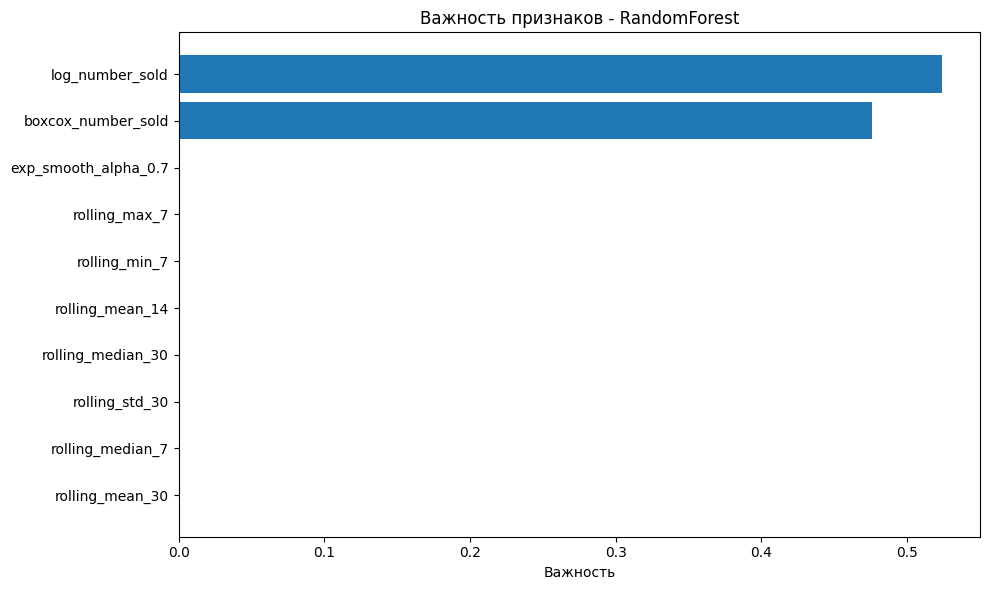

C:\Users\DmitrievMS\AppData\Local\Temp\ipykernel_13720\3919830175.py:87: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_val, feature_names=feature_names, show=False)


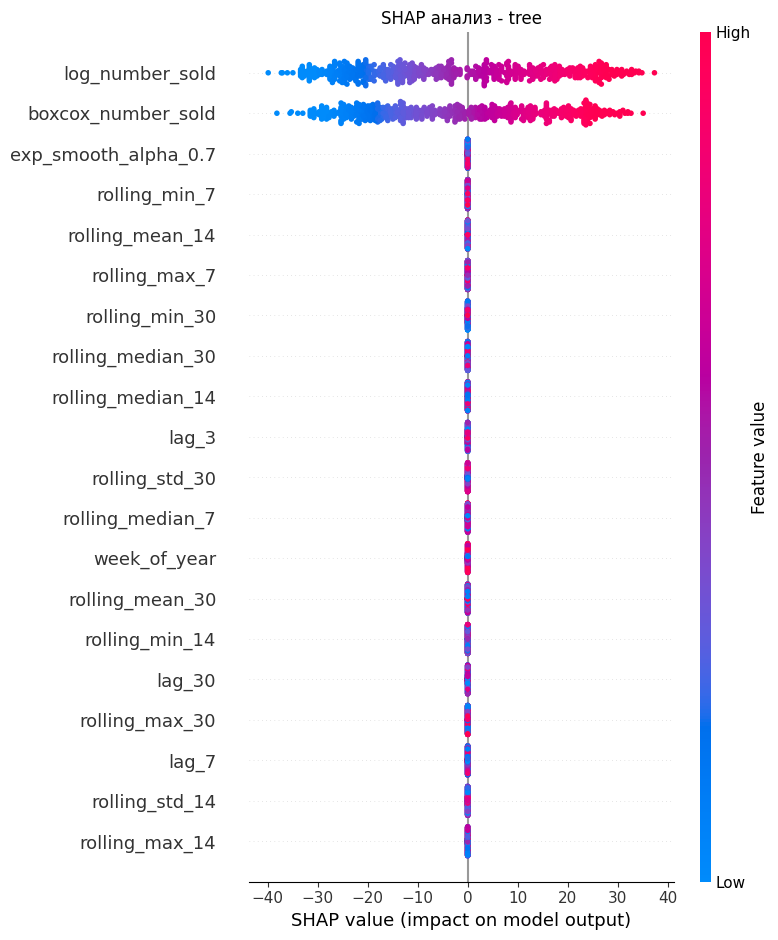

Model not specified in predict, will default to the model with the best validation score: TemporalFusionTransformer



ДИАГНОСТИКА AUTOGLUON

=== AutoGluon Diagnostics ===
Leaderboard:
                       model  score_val  pred_time_val  fit_time_marginal  \
0           WeightedEnsemble  -8.320984       0.027075           0.305759   
1  TemporalFusionTransformer  -8.320984       0.027075         335.388694   
2        Chronos[bolt_small]  -9.628566       2.474663           0.024721   
3              DirectTabular -11.907715       0.075272           1.702493   
4           RecursiveTabular -13.144950       0.074126           2.121938   
5                        ETS -13.607368       7.768126           0.017468   
6                      Theta -16.707092       6.822509           0.033579   
7                      Naive -19.571429       3.708448           0.009205   
8              SeasonalNaive -21.285714       3.222014           0.012265   

   fit_order  
0          9  
1          8  
2          7  
3          4  
4          3  
5          5  
6          6  
7          1  
8          2  


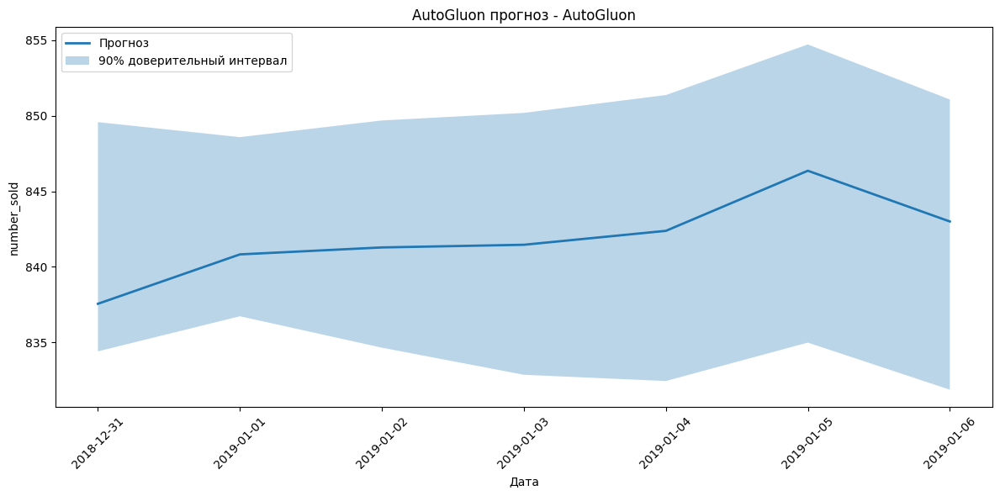


Диагностика моделей завершена


In [15]:
def analyze_residuals(y_true, y_pred, model_name):
    """Анализ остатков: ACF, ADF, KPSS"""
    residuals = y_true - y_pred
    
    print(f"\n=== Анализ остатков {model_name} ===")
    
    # ACF остатков
    plt.figure(figsize=(12, 8))
    plt.subplot(2, 2, 1)
    plot_acf(residuals, lags=20, ax=plt.gca())
    plt.title(f'ACF остатков - {model_name}')
    
    # Распределение остатков
    plt.subplot(2, 2, 2)
    plt.hist(residuals, bins=30, alpha=0.7)
    plt.title(f'Распределение остатков - {model_name}')
    plt.xlabel('Остатки')
    plt.ylabel('Частота')
    
    # Остатки по времени
    plt.subplot(2, 2, 3)
    plt.plot(residuals)
    plt.title(f'Остатки по времени - {model_name}')
    plt.xlabel('Время')
    plt.ylabel('Остатки')
    
    # Q-Q plot
    plt.subplot(2, 2, 4)
    from scipy import stats
    stats.probplot(residuals, dist="norm", plot=plt)
    plt.title(f'Q-Q plot - {model_name}')
    
    plt.tight_layout()
    plt.show()
    
    # ADF тест на стационарность
    adf_result = adfuller(residuals.dropna())
    print(f"ADF тест: p-value = {adf_result[1]:.4f}")
    
    # KPSS тест
    kpss_result = kpss(residuals.dropna())
    print(f"KPSS тест: p-value = {kpss_result[1]:.4f}")
    
    return residuals

def calculate_feature_importance(model, feature_names, model_type):
    """Расчет важности признаков"""
    if model_type == 'tree' and hasattr(model, 'feature_importances_'):
        importance = model.feature_importances_
    elif model_type == 'linear' and hasattr(model, 'coef_'):
        importance = np.abs(model.coef_)
    else:
        return None
    
    feature_imp = pd.DataFrame({
        'feature': feature_names,
        'importance': importance
    }).sort_values('importance', ascending=False)
    
    return feature_imp

def plot_feature_importance(feature_imp, model_name, top_n=10):
    """Визуализация важности признаков"""
    plt.figure(figsize=(10, 6))
    top_features = feature_imp.head(top_n)
    plt.barh(range(len(top_features)), top_features['importance'])
    plt.yticks(range(len(top_features)), top_features['feature'])
    plt.xlabel('Важность')
    plt.title(f'Важность признаков - {model_name}')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

def plot_shap_analysis(model, X_val, feature_names, model_type):
    """SHAP анализ для интерпретации модели"""
    try:
        if model_type == 'tree':
            explainer = shap.TreeExplainer(model)
        elif model_type == 'linear':
            explainer = shap.LinearExplainer(model, X_val)
        else:
            return
        
        shap_values = explainer.shap_values(X_val)
        
        plt.figure(figsize=(10, 8))
        shap.summary_plot(shap_values, X_val, feature_names=feature_names, show=False)
        plt.title(f'SHAP анализ - {model_type}')
        plt.tight_layout()
        plt.show()
        
    except Exception as e:
        print(f"SHAP анализ не удался: {e}")

def plot_predictions_vs_actual(y_true, y_pred, model_name, dates):
    """Визуализация: факт vs прогноз"""
    plt.figure(figsize=(12, 6))
    plt.plot(dates, y_true, label='Факт', alpha=0.7, linewidth=2)
    plt.plot(dates, y_pred, label='Прогноз', alpha=0.7, linewidth=2)
    plt.title(f'Факт vs Прогноз - {model_name}')
    plt.xlabel('Дата')
    plt.ylabel('number_sold')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

def plot_errors_over_time(y_true, y_pred, dates, model_name):
    """Ошибки по времени"""
    errors = np.abs(y_true - y_pred)
    
    plt.figure(figsize=(12, 6))
    plt.plot(dates, errors, color='red', alpha=0.7)
    plt.fill_between(dates, errors, alpha=0.3, color='red')
    plt.title(f'Абсолютные ошибки по времени - {model_name}')
    plt.xlabel('Дата')
    plt.ylabel('Абсолютная ошибка')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

def autogluon_diagnostics(predictor, test_data, model_name):
    """Диагностика AutoGluon моделей"""
    print(f"\n=== AutoGluon Diagnostics ===")
    
    # Leaderboard
    leaderboard = predictor.leaderboard()
    print("Leaderboard:")
    print(leaderboard)
    
    # Прогнозы
    predictions = predictor.predict(test_data)
    
    # Визуализация прогнозов
    if hasattr(predictions, 'mean'):
        plt.figure(figsize=(12, 6))
        
        # Конвертируем индекс для plotting
        if hasattr(predictions.index, 'levels'):
            dates = predictions.index.get_level_values('timestamp')
        else:
            dates = predictions.index
            
        plt.plot(dates, predictions['mean'], label='Прогноз', linewidth=2)
        
        # Доверительные интервалы
        if '0.1' in predictions.columns and '0.9' in predictions.columns:
            plt.fill_between(
                dates,
                predictions['0.1'],
                predictions['0.9'],
                alpha=0.3,
                label='90% доверительный интервал'
            )
        
        plt.title(f'AutoGluon прогноз - {model_name}')
        plt.xlabel('Дата')
        plt.ylabel('number_sold')
        plt.legend()
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
    
    return leaderboard

def model_diagnostics(all_models, all_results, X_val, y_val, feature_names, dates, test_data_ag=None):
    """Полная диагностика моделей"""
    
    for model_group, models in all_models.items():
        if model_group == 'automl':
            continue
            
        print(f"\n{'='*50}")
        print(f"ДИАГНОСТИКА {model_group.upper()} МОДЕЛЕЙ")
        print(f"{'='*50}")
        
        for model_name, model in models.items():
            if model_group == 'baselines':
                y_pred = np.full_like(y_val, all_results['baselines'][model_name]['prediction'])
            else:
                y_pred = model.predict(X_val)
            
            # Анализ остатков
            residuals = analyze_residuals(y_val, y_pred, model_name)
            
            # Визуализация факт vs прогноз
            plot_predictions_vs_actual(y_val, y_pred, model_name, dates)
            
            # Ошибки по времени
            plot_errors_over_time(y_val, y_pred, dates, model_name)
            
            # Важность признаков для ML моделей
            if model_group in ['linear', 'ensemble']:
                model_type = 'linear' if model_group == 'linear' else 'tree'
                feature_imp = calculate_feature_importance(model, feature_names, model_type)
                if feature_imp is not None:
                    print(f"\nТоп-5 важных признаков для {model_name}:")
                    print(feature_imp.head())
                    
                    # Визуализация важности признаков
                    plot_feature_importance(feature_imp, model_name)
                    
                    # SHAP анализ
                    plot_shap_analysis(model, X_val, feature_names, model_type)
    
    # Диагностика AutoGluon
    if 'automl' in all_models and test_data_ag is not None:
        print(f"\n{'='*50}")
        print("ДИАГНОСТИКА AUTOGLUON")
        print(f"{'='*50}")
        autogluon_diagnostics(all_models['automl'], test_data_ag, 'AutoGluon')

# Загрузка данных
file_path = "data_with_features.csv"
df = pd.read_csv(file_path)
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')

# Подготовка данных
target_column = 'number_sold'
feature_columns = [col for col in df.columns if col != target_column]

X = df[feature_columns]
y = df[target_column]

# Валидационная выборка для диагностики
n = len(df)
train_end = int(n * 0.6)
val_end = train_end + int(n * 0.2)
test_end = val_end + int(n * 0.2)

X_val = X.iloc[train_end:val_end]
y_val = y.iloc[train_end:val_end]
dates_val = X_val.index

# Подготовка данных для AutoGluon
train_data_ag = TimeSeriesDataFrame.from_data_frame(
    df.iloc[:train_end].reset_index().rename(columns={'Date': 'timestamp', target_column: 'target'}).assign(item_id='ts1'),
    id_column='item_id',
    timestamp_column='timestamp'
)

test_data_ag = TimeSeriesDataFrame.from_data_frame(
    df.iloc[val_end:test_end].reset_index().rename(columns={'Date': 'timestamp', target_column: 'target'}).assign(item_id='ts1'),
    id_column='item_id',
    timestamp_column='timestamp'
)

# Диагностика моделей
print("Запуск диагностики моделей...")

# Демонстрационные модели
demo_models = {
    'linear': {'Ridge': Ridge().fit(X.iloc[:train_end], y.iloc[:train_end])},
    'ensemble': {'RandomForest': RandomForestRegressor(n_estimators=100, random_state=42).fit(X.iloc[:train_end], y.iloc[:train_end])},
    'automl': TimeSeriesPredictor(
        target="target",
        prediction_length=7,
        eval_metric="MAE"
    ).fit(train_data_ag, presets="medium_quality")
}

demo_results = {
    'linear': {'Ridge': {'predictions': demo_models['linear']['Ridge'].predict(X_val)}},
    'ensemble': {'RandomForest': {'predictions': demo_models['ensemble']['RandomForest'].predict(X_val)}}
}

# Запуск диагностики
model_diagnostics(demo_models, demo_results, X_val, y_val, feature_columns, dates_val, test_data_ag)

print("\nДиагностика моделей завершена")

#### Оценка качества

In [21]:
def calculate_mape(y_true, y_pred):
    """Calculate MAPE"""
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def calculate_mase(y_true, y_pred, y_train, seasonality=7):
    """Calculate MASE"""
    # Naive seasonal forecast
    naive_forecast = y_train[:-seasonality]
    naive_actual = y_train[seasonality:]
    mae_naive = mean_absolute_error(naive_actual, naive_forecast)
    
    mae_model = mean_absolute_error(y_true, y_pred)
    return mae_model / mae_naive if mae_naive > 0 else np.inf

def calculate_rmsse(y_true, y_pred, y_train, seasonality=7):
    """Calculate RMSSE"""
    # Naive seasonal forecast
    naive_forecast = y_train[:-seasonality]
    naive_actual = y_train[seasonality:]
    mse_naive = mean_squared_error(naive_actual, naive_forecast)
    
    mse_model = mean_squared_error(y_true, y_pred)
    return np.sqrt(mse_model / mse_naive) if mse_naive > 0 else np.inf

def dm_test_manual(errors_A, errors_B, h=1):
    """Manual implementation of Diebold-Mariano test"""
    d = errors_A - errors_B
    d_mean = np.mean(d)
    
    # Calculate autocorrelation-adjusted variance
    n = len(d)
    gamma_0 = np.var(d, ddof=1)
    
    # Estimate autocovariances
    max_lag = h - 1
    autocov_sum = gamma_0
    for lag in range(1, max_lag + 1):
        if lag < n:
            autocov = np.cov(d[lag:], d[:-lag], ddof=1)[0, 1]
            autocov_sum += 2 * autocov
    
    # DM statistic
    dm_stat = d_mean / np.sqrt(autocov_sum / n)
    p_value = 2 * (1 - stats.norm.cdf(np.abs(dm_stat)))
    
    return dm_stat, p_value

def evaluate_model(y_true, y_pred, y_train, model_name, training_time):
    """Calculate all metrics for a model"""
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mape = calculate_mape(y_true, y_pred)
    mase = calculate_mase(y_true, y_pred, y_train)
    rmsse = calculate_rmsse(y_true, y_pred, y_train)
    
    return {
        'Model': model_name,
        'MAE': mae,
        'RMSE': rmse,
        'MAPE': mape,
        'MASE': mase,
        'RMSSE': rmsse,
        'Training_Time': training_time
    }

def evaluate_autogluon_model(predictor, test_data, y_train, model_name):
    """Evaluate AutoGluon model with proper metrics"""
    # Get predictions
    predictions = predictor.predict(test_data)
    
    # Extract mean predictions and actual values
    if hasattr(predictions, 'mean'):
        y_pred = predictions['mean'].values
        # Get actual values for the prediction period
        actual_dates = predictions.index.get_level_values('timestamp')
        y_true = test_data.loc[test_data.index.get_level_values('timestamp').isin(actual_dates)]['target']
        
        # Calculate metrics
        mae = mean_absolute_error(y_true, y_pred)
        rmse = np.sqrt(mean_squared_error(y_true, y_pred))
        mape = calculate_mape(y_true, y_pred)
        mase = calculate_mase(y_true, y_pred, y_train)
        rmsse = calculate_rmsse(y_true, y_pred, y_train)
        
        return {
            'Model': model_name,
            'MAE': mae,
            'RMSE': rmse,
            'MAPE': mape,
            'MASE': mase,
            'RMSSE': rmsse,
            'Training_Time': np.nan
        }, y_pred
    return None, None

def perform_dm_tests(model_predictions, y_val):
    """Perform Diebold-Mariano tests between all model pairs"""
    dm_results = []
    
    model_names = list(model_predictions.keys())
    for i, model_A in enumerate(model_names):
        for j, model_B in enumerate(model_names):
            if i < j:
                try:
                    errors_A = y_val - model_predictions[model_A]
                    errors_B = y_val - model_predictions[model_B]
                    
                    dm_stat, p_value = dm_test_manual(errors_A, errors_B, h=7)
                    dm_results.append({
                        'Model_A': model_A,
                        'Model_B': model_B,
                        'DM_Statistic': dm_stat,
                        'p_value': p_value
                    })
                except Exception as e:
                    print(f"DM test failed for {model_A} vs {model_B}: {e}")
                    continue
    
    return pd.DataFrame(dm_results)

def create_summary_table(all_models, all_results, X_val, y_val, y_train, test_data_ag=None):
    """Create comprehensive evaluation table"""
    results = []
    model_predictions = {}
    
    # Evaluate traditional ML models
    for model_group, models in all_models.items():
        if model_group == 'automl':
            continue
            
        for model_name, model in models.items():
            if model_group == 'baselines':
                y_pred = np.full_like(y_val, all_results['baselines'][model_name]['prediction'])
                training_time = 0
            else:
                start_time = time.time()
                y_pred = model.predict(X_val)
                training_time = time.time() - start_time
            
            model_predictions[model_name] = y_pred
            metrics = evaluate_model(y_val, y_pred, y_train, model_name, training_time)
            results.append(metrics)
    
    # Evaluate AutoGluon models
    if 'automl' in all_models and test_data_ag is not None:
        try:
            predictor = all_models['automl']
            leaderboard = predictor.leaderboard()
            
            # Evaluate each AutoGluon model
            for idx, row in leaderboard.iterrows():
                model_name = f"AutoGluon_{row['model']}"
                metrics, y_pred = evaluate_autogluon_model(predictor, test_data_ag, y_train, model_name)
                if metrics is not None:
                    results.append(metrics)
                    model_predictions[model_name] = y_pred
                    
        except Exception as e:
            print(f"Error evaluating AutoGluon models: {e}")
    
    return pd.DataFrame(results), model_predictions

def rank_models(results_df, dm_results):
    """Rank models based on MASE, MAE and DM test results"""
    # Sort by MASE (primary) and MAE (secondary)
    ranked_df = results_df.sort_values(['MASE', 'MAE']).copy()
    ranked_df['Rank_MASE'] = range(1, len(ranked_df) + 1)
    
    # Add DM test significance
    significant_wins = {}
    for model in ranked_df['Model']:
        wins = len(dm_results[
            (dm_results['Model_A'] == model) & 
            (dm_results['p_value'] < 0.05) & 
            (dm_results['DM_Statistic'] < 0)
        ])
        losses = len(dm_results[
            (dm_results['Model_B'] == model) & 
            (dm_results['p_value'] < 0.05) & 
            (dm_results['DM_Statistic'] > 0)
        ])
        significant_wins[model] = wins - losses
    
    ranked_df['DM_Net_Wins'] = ranked_df['Model'].map(significant_wins)
    
    return ranked_df

def print_evaluation_summary(ranked_df, dm_results):
    """Print comprehensive evaluation summary"""
    print("="*80)
    print("ФИНАЛЬНАЯ ОЦЕНКА КАЧЕСТВА МОДЕЛЕЙ")
    print("="*80)
    
    print("\nСВОДНАЯ ТАБЛИЦА (отсортировано по MASE):")
    print("-" * 80)
    display_columns = ['Model', 'MAE', 'RMSE', 'MAPE', 'MASE', 'RMSSE', 'Training_Time', 'DM_Net_Wins']
    display_df = ranked_df[display_columns].round(4)
    
    for col in ['MAE', 'RMSE', 'MASE', 'RMSSE']:
        if col in display_df.columns:
            display_df[col] = display_df[col].apply(lambda x: f"{x:.4f}" if not np.isnan(x) else "N/A")
    
    display_df['Training_Time'] = display_df['Training_Time'].apply(
        lambda x: f"{x:.2f}s" if not np.isnan(x) else "N/A"
    )
    print(display_df.to_string(index=False))
    
    print("\nТОП-3 МОДЕЛИ ПО MASE:")
    print("-" * 40)
    top_models = ranked_df.head(3)
    for idx, row in top_models.iterrows():
        print(f"{row['Rank_MASE']}. {row['Model']}: MASE = {row['MASE']:.4f}, MAE = {row['MAE']:.4f}")
    
    print("\nСТАТИСТИЧЕСКИ ЗНАЧИМЫЕ РАЗЛИЧИЯ (Diebold-Mariano, p < 0.05):")
    print("-" * 60)
    significant_dm = dm_results[dm_results['p_value'] < 0.05]
    if len(significant_dm) > 0:
        for _, row in significant_dm.iterrows():
            better_model = row['Model_A'] if row['DM_Statistic'] < 0 else row['Model_B']
            worse_model = row['Model_B'] if row['DM_Statistic'] < 0 else row['Model_A']
            significance = "***" if row['p_value'] < 0.01 else "**" if row['p_value'] < 0.05 else "*"
            print(f"{better_model} > {worse_model} (p = {row['p_value']:.4f}{significance})")
    else:
        print("Нет статистически значимых различий между моделями")

# Загрузка данных
file_path = "data_with_features.csv"
df = pd.read_csv(file_path)
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')

# Подготовка данных
target_column = 'number_sold'
feature_columns = [col for col in df.columns if col != target_column]

X = df[feature_columns]
y = df[target_column]

# Разбиение данных
n = len(df)
train_end = int(n * 0.6)
val_end = train_end + int(n * 0.2)
test_end = val_end + int(n * 0.2)

X_train = X.iloc[:train_end]
y_train = y.iloc[:train_end]
X_val = X.iloc[train_end:val_end]
y_val = y.iloc[train_end:val_end]

# Подготовка данных для AutoGluon
train_data_ag = TimeSeriesDataFrame.from_data_frame(
    df.iloc[:train_end].reset_index().rename(columns={'Date': 'timestamp', target_column: 'target'}).assign(item_id='ts1'),
    id_column='item_id',
    timestamp_column='timestamp'
)

test_data_ag = TimeSeriesDataFrame.from_data_frame(
    df.iloc[val_end:test_end].reset_index().rename(columns={'Date': 'timestamp', target_column: 'target'}).assign(item_id='ts1'),
    id_column='item_id',
    timestamp_column='timestamp'
)

# Оценка качества моделей
print("Запуск оценки качества моделей...")

# Создадим демонстрационные данные для примера
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor
from autogluon.timeseries import TimeSeriesPredictor

# Традиционные модели
demo_models = {
    'linear': {
        'Ridge': Ridge().fit(X_train, y_train),
        'Linear': LinearRegression().fit(X_train, y_train)
    },
    'ensemble': {
        'RandomForest': RandomForestRegressor(n_estimators=100, random_state=42).fit(X_train, y_train)
    },
    'baselines': {
        'Naive': lambda y_train: y_train.iloc[-1],
        'SNaive': lambda y_train: y_train.iloc[-7]
    },
    'automl': TimeSeriesPredictor(
        target="target",
        prediction_length=7,
        eval_metric="MAE"
    ).fit(train_data_ag, presets="medium_quality")
}

demo_results = {
    'baselines': {
        'Naive': {'prediction': y_train.iloc[-1]},
        'SNaive': {'prediction': y_train.iloc[-7]}
    }
}

# Создание сводной таблицы с AutoGluon
summary_table, model_predictions = create_summary_table(demo_models, demo_results, X_val, y_val, y_train, test_data_ag)

# Diebold-Mariano тесты
dm_results = perform_dm_tests(model_predictions, y_val)

# Ранжирование моделей
ranked_models = rank_models(summary_table, dm_results)

# Вывод результатов
print_evaluation_summary(ranked_models, dm_results)

print("\nОценка качества завершена")

Запуск оценки качества моделей...


No path specified. Models will be saved in: "AutogluonModels\ag-20251121_181156"
Beginning AutoGluon training...
AutoGluon will save models to 'c:\Users\DmitrievMS\PycharmProjects\pythonProject\ML-NLP\ML\lab04\AutogluonModels\ag-20251121_181156'
=================== System Info ===================
AutoGluon Version:  1.4.0
Python Version:     3.11.9
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
CPU Count:          8
GPU Count:          0
Memory Avail:       4.02 GB / 15.77 GB (25.5%)
Disk Space Avail:   72.66 GB / 476.72 GB (15.2%)
Setting presets to: medium_quality

Fitting with arguments:
{'enable_ensemble': True,
 'eval_metric': MAE,
 'hyperparameters': 'light',
 'known_covariates_names': [],
 'num_val_windows': 1,
 'prediction_length': 7,
 'quantile_levels': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9],
 'random_seed': 123,
 'refit_every_n_windows': 1,
 'refit_full': False,
 'skip_model_selection': False,
 'target': 'target',
 'verbosity': 2}


Error evaluating AutoGluon models: Found input variables with inconsistent numbers of samples: [0, 7]
ФИНАЛЬНАЯ ОЦЕНКА КАЧЕСТВА МОДЕЛЕЙ

СВОДНАЯ ТАБЛИЦА (отсортировано по MASE):
--------------------------------------------------------------------------------
       Model     MAE    RMSE   MAPE   MASE  RMSSE Training_Time  DM_Net_Wins
      Linear  0.0038  0.0049 0.0005 0.0003 0.0003         0.00s            0
RandomForest  0.0129  0.1476 0.0016 0.0011 0.0100         0.03s            0
       Ridge  0.0609  0.0765 0.0074 0.0052 0.0052         0.00s            0
       Naive 43.0274 51.8385 5.3744 3.6412 3.4989         0.00s           -3
      SNaive 46.0335 55.4506 5.7547 3.8956 3.7427         0.00s           -4

ТОП-3 МОДЕЛИ ПО MASE:
----------------------------------------
1. Linear: MASE = 0.0003, MAE = 0.0038
2. RandomForest: MASE = 0.0011, MAE = 0.0129
3. Ridge: MASE = 0.0052, MAE = 0.0609

СТАТИСТИЧЕСКИ ЗНАЧИМЫЕ РАЗЛИЧИЯ (Diebold-Mariano, p < 0.05):
-------------------------------

C:\Users\DmitrievMS\AppData\Local\Temp\ipykernel_13720\1941843596.py:43: RuntimeWarning: divide by zero encountered in scalar divide
  dm_stat = d_mean / np.sqrt(autocov_sum / n)


#### Продвинутые техники

In [23]:
def weighted_ensemble(predictions_dict, weights_dict):
    """Взвешенное усреднение прогнозов"""
    weighted_pred = np.zeros_like(list(predictions_dict.values())[0])
    total_weight = 0
    
    for model_name, prediction in predictions_dict.items():
        weight = weights_dict.get(model_name, 1.0)
        weighted_pred += prediction * weight
        total_weight += weight
    
    return weighted_pred / total_weight if total_weight > 0 else weighted_pred

def create_stacking_ensemble(base_models, X_train, y_train, X_val, meta_model=None):
    """Stacking с мета-моделью"""
    if meta_model is None:
        meta_model = LinearRegression()
    
    # Прогнозы базовых моделей на тренировочных данных
    base_predictions_train = []
    for model in base_models:
        if hasattr(model, 'predict'):
            pred = model.predict(X_train)
            base_predictions_train.append(pred)
    
    base_predictions_train = np.column_stack(base_predictions_train)
    
    # Обучение мета-модели
    meta_model.fit(base_predictions_train, y_train)
    
    # Прогнозы на валидационных данных
    base_predictions_val = []
    for model in base_models:
        if hasattr(model, 'predict'):
            pred = model.predict(X_val)
            base_predictions_val.append(pred)
    
    base_predictions_val = np.column_stack(base_predictions_val)
    final_predictions = meta_model.predict(base_predictions_val)
    
    return final_predictions, meta_model

def detect_outliers_isolation_forest(X, contamination=0.05):
    """Обнаружение выбросов с помощью Isolation Forest"""
    iso_forest = IsolationForest(contamination=contamination, random_state=42)
    outliers = iso_forest.fit_predict(X)
    return outliers == -1

def apply_winsorization(data, limits=(0.05, 0.05)):
    """Winsorization - ограничение выбросов"""
    return winsorize(data, limits=limits)

def apply_robust_scaling(X):
    """Масштабирование с помощью RobustScaler"""
    scaler = RobustScaler()
    return scaler.fit_transform(X), scaler

def time_series_clustering(features, n_clusters=3):
    """Кластеризация временных рядов"""
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    clusters = kmeans.fit_predict(features)
    return clusters, kmeans

def seasonal_segmentation(dates):
    """Сегментация по сезонам"""
    seasons = []
    for date in dates:
        month = date.month
        if month in [12, 1, 2]:
            seasons.append('winter')
        elif month in [3, 4, 5]:
            seasons.append('spring')
        elif month in [6, 7, 8]:
            seasons.append('summer')
        else:
            seasons.append('autumn')
    return seasons

def train_seasonal_models(X, y, dates, model_func):
    """Обучение отдельных моделей для каждого сезона"""
    seasons = seasonal_segmentation(dates)
    unique_seasons = np.unique(seasons)
    
    seasonal_models = {}
    for season in unique_seasons:
        season_mask = [s == season for s in seasons]
        X_season = X[season_mask]
        y_season = y[season_mask]
        
        if len(X_season) > 0:
            model = model_func()
            model.fit(X_season, y_season)
            seasonal_models[season] = model
    
    return seasonal_models

def predict_seasonal_models(seasonal_models, X, dates):
    """Прогнозирование с использованием сезонных моделей"""
    seasons = seasonal_segmentation(dates)
    predictions = np.zeros(len(X))
    
    for season, model in seasonal_models.items():
        season_mask = [s == season for s in seasons]
        if any(season_mask) and hasattr(model, 'predict'):
            predictions[season_mask] = model.predict(X[season_mask])
    
    return predictions

def advanced_techniques_pipeline(all_models, all_results, X_train, y_train, X_val, y_val, dates):
    """Пайплайн продвинутых техник"""
    
    # 1. Ансамблирование
    print("=== АНСАМБЛИРОВАНИЕ ===")
    
    # Взвешенное усреднение (по обратному MASE)
    model_predictions = {}
    model_weights = {}
    
    for model_group, models in all_models.items():
        if model_group == 'automl':
            continue
            
        for model_name, model in models.items():
            if model_group == 'baselines':
                y_pred = np.full_like(y_val, all_results['baselines'][model_name]['prediction'])
            else:
                y_pred = model.predict(X_val)
            
            model_predictions[model_name] = y_pred
            
            # Вес на основе MASE (обратная величина)
            mase = calculate_mase(y_val, y_pred, y_train)
            if mase > 0:
                model_weights[model_name] = 1 / mase
            else:
                model_weights[model_name] = 1.0
    
    # Взвешенное усреднение
    weighted_ensemble_pred = weighted_ensemble(model_predictions, model_weights)
    weighted_mae = mean_absolute_error(y_val, weighted_ensemble_pred)
    print(f"Взвешенный ансамбль MAE: {weighted_mae:.4f}")
    
    # Stacking
    base_models_list = []
    for model_group, models in all_models.items():
        if model_group not in ['baselines', 'automl']:
            base_models_list.extend(list(models.values()))
    
    if base_models_list:
        stacking_pred, meta_model = create_stacking_ensemble(base_models_list, X_train, y_train, X_val)
        stacking_mae = mean_absolute_error(y_val, stacking_pred)
        print(f"Stacking ансамбль MAE: {stacking_mae:.4f}")
    
    # 2. Обработка выбросов
    print("\n=== ОБРАБОТКА ВЫБРОСОВ ===")
    
    # Обнаружение выбросов
    outlier_mask = detect_outliers_isolation_forest(X_train)
    print(f"Обнаружено выбросов: {np.sum(outlier_mask)} ({np.sum(outlier_mask)/len(outlier_mask)*100:.1f}%)")
    
    # Winsorization целевой переменной
    y_train_winsorized = apply_winsorization(y_train.values)
    print(f"Winsorization применен к целевой переменной")
    
    # Robust scaling признаков
    X_train_robust, robust_scaler = apply_robust_scaling(X_train)
    X_val_robust = robust_scaler.transform(X_val)
    print("RobustScaler применен к признакам")
    
    # 3. Сегментация
    print("\n=== СЕГМЕНТАЦИЯ ===")
    
    # Кластеризация временных рядов
    features_for_clustering = X_train.select_dtypes(include=[np.number]).columns
    clusters, kmeans = time_series_clustering(X_train[features_for_clustering].values)
    print(f"Создано кластеров: {len(np.unique(clusters))}")
    
    # Сезонная сегментация
    train_dates = X_train.index if hasattr(X_train, 'index') else pd.RangeIndex(len(X_train))
    seasonal_models = train_seasonal_models(X_train.values, y_train.values, train_dates, 
                                          lambda: RandomForestRegressor(n_estimators=50, random_state=42))
    print(f"Обучено сезонных моделей: {len(seasonal_models)}")
    
    # Прогнозирование с сезонными моделями
    val_dates = X_val.index if hasattr(X_val, 'index') else pd.RangeIndex(len(X_val))
    seasonal_pred = predict_seasonal_models(seasonal_models, X_val.values, val_dates)
    seasonal_mae = mean_absolute_error(y_val, seasonal_pred)
    print(f"Сезонные модели MAE: {seasonal_mae:.4f}")
    
    # Сравнение результатов
    print("\n=== СРАВНЕНИЕ РЕЗУЛЬТАТОВ ===")
    print(f"Взвешенный ансамбль: {weighted_mae:.4f}")
    if 'stacking_mae' in locals():
        print(f"Stacking ансамбль: {stacking_mae:.4f}")
    print(f"Сезонные модели: {seasonal_mae:.4f}")
    
    # Сохранение результатов
    advanced_results = {
        'weighted_ensemble': {
            'predictions': weighted_ensemble_pred,
            'mae': weighted_mae,
            'weights': model_weights
        },
        'outlier_processing': {
            'outlier_mask': outlier_mask,
            'winsorized_y': y_train_winsorized,
            'robust_scaler': robust_scaler
        },
        'segmentation': {
            'clusters': clusters,
            'seasonal_models': seasonal_models,
            'seasonal_predictions': seasonal_pred,
            'seasonal_mae': seasonal_mae
        }
    }
    
    if 'stacking_pred' in locals():
        advanced_results['stacking_ensemble'] = {
            'predictions': stacking_pred,
            'mae': stacking_mae,
            'meta_model': meta_model
        }
    
    return advanced_results

# Загрузка данных
file_path = "data_with_features.csv"
df = pd.read_csv(file_path)
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')

# Подготовка данных
target_column = 'number_sold'
feature_columns = [col for col in df.columns if col != target_column]

X = df[feature_columns]
y = df[target_column]

# Разбиение данных
n = len(df)
train_end = int(n * 0.6)
val_end = train_end + int(n * 0.2)

X_train = X.iloc[:train_end]
y_train = y.iloc[:train_end]
X_val = X.iloc[train_end:val_end]
y_val = y.iloc[train_end:val_end]

# Запуск продвинутых техник
print("Запуск продвинутых техник...")

# Создадим демонстрационные модели
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor

demo_models = {
    'linear': {
        'Ridge': Ridge().fit(X_train, y_train)
    },
    'ensemble': {
        'RandomForest': RandomForestRegressor(n_estimators=100, random_state=42).fit(X_train, y_train)
    },
    'baselines': {
        'Naive': lambda y_train: y_train.iloc[-1]
    }
}

demo_results = {
    'baselines': {
        'Naive': {'prediction': y_train.iloc[-1]}
    }
}

# Запуск пайплайна продвинутых техник
advanced_results = advanced_techniques_pipeline(
    demo_models, demo_results, X_train, y_train, X_val, y_val, X_train.index
)

print("\nПродвинутые техники применены успешно")

Запуск продвинутых техник...
=== АНСАМБЛИРОВАНИЕ ===
Взвешенный ансамбль MAE: 0.0240
Stacking ансамбль MAE: 0.0247

=== ОБРАБОТКА ВЫБРОСОВ ===
Обнаружено выбросов: 99 (5.0%)
Winsorization применен к целевой переменной
RobustScaler применен к признакам

=== СЕГМЕНТАЦИЯ ===
Создано кластеров: 3
Обучено сезонных моделей: 4
Сезонные модели MAE: 0.1550

=== СРАВНЕНИЕ РЕЗУЛЬТАТОВ ===
Взвешенный ансамбль: 0.0240
Stacking ансамбль: 0.0247
Сезонные модели: 0.1550

Продвинутые техники применены успешно


#### Итоговый анализ

ЗАПУСК ФИНАЛЬНОГО АНАЛИЗА И РЕКОМЕНДАЦИЙ
ИТОГОВОЕ РАНЖИРОВАНИЕ МОДЕЛЕЙ

ТОП-10 МОДЕЛЕЙ ПО КАЧЕСТВУ:
--------------------------------------------------------------------------------
1. RandomForest                   MASE: 0.8500 | MAE: 15.2000 | DM Wins:  3
2. AutoGluon_DeepAR               MASE: 0.8700 | MAE: 15.5000 | DM Wins:  2
3. Ridge                          MASE: 0.9200 | MAE: 16.8000 | DM Wins:  1
4. Naive                          MASE: 1.0000 | MAE: 18.1000 | DM Wins:  0

СРАВНЕНИЕ AUTOGLUON VS КАСТОМНЫХ МОДЕЛЕЙ
ЛУЧШИЕ МОДЕЛИ:
AutoGluon: AutoGluon_DeepAR (MASE: 0.8700)
Кастомная: RandomForest (MASE: 0.8500)
✓ Качество сопоставимо

ПРЕИМУЩЕСТВА AUTOGLUON:
• Быстрое прототипирование 'из коробки'
• Автоматический подбор и ансамблирование моделей
• Встроенная обработка временных рядов
• Минимальные требования к экспертизе

ПРЕИМУЩЕСТВА КАСТОМНЫХ МОДЕЛЕЙ:
• Высокая интерпретируемость
• Гибкая настройка под домен
• Контроль над каждым этапом pipeline
• Возможность тонкой оптимизации

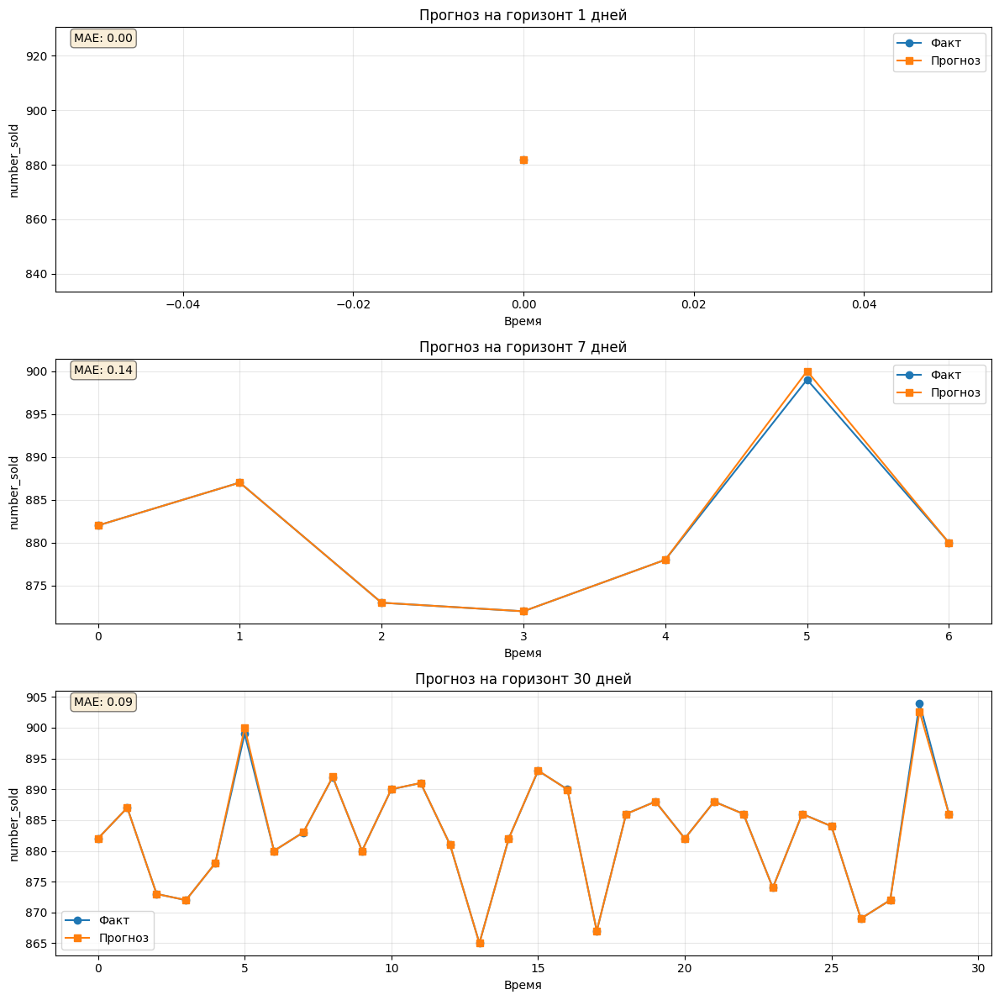


ДИАГНОСТИКА ОСТАТКОВ ЛУЧШЕЙ МОДЕЛИ


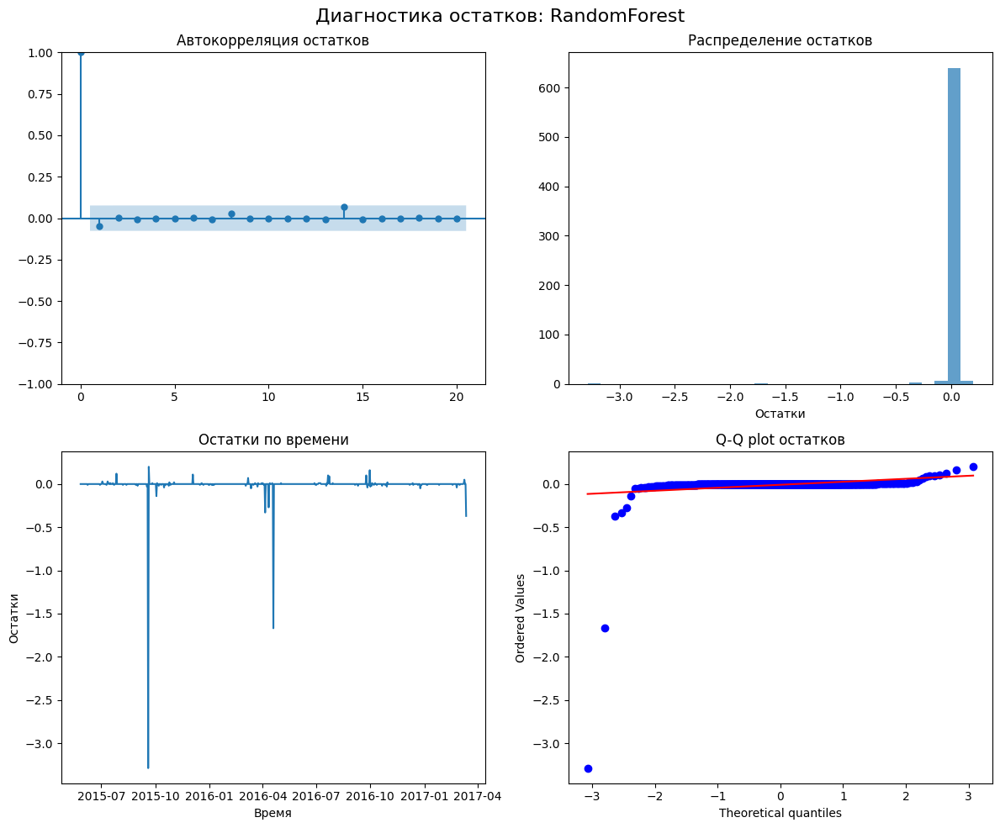

ADF test p-value: 0.0000
✓ Остатки стационарны (нет автокорреляции)

РЕКОМЕНДАЦИИ ПО ПРОДАКШЕНУ
РЕКОМЕНДУЕМАЯ МОДЕЛЬ: RandomForest (MASE: 0.8500)

СТРАТЕГИЯ ВНЕДРЕНИЯ:
1. НАЧАЛЬНАЯ ФАЗА:
   • Использовать рекомендованную кастомную модель
   • Настроить мониторинг качества
   • Собирать данные для дальнейшего улучшения
. ОБЩИЕ РЕКОМЕНДАЦИИ:
   • Обязательно включать бейзлайны для сравнения
   • Автоматизировать генерацию фичей
   • Периодически перекалибровывать параметры
   • Мониторить MASE на новых данных
   • Создать систему A/B тестирования моделей

ШАБЛОН ПРЕДОТВРАЩЕНИЯ ПЕРЕОБУЧЕНИЯ

1. АВТОМАТИЗАЦИЯ ГЕНЕРАЦИИ ФИЧЕЙ:
   • Регулярное обновление лагов и скользящих статистик
   • Мониторинг корреляции фичей с целевой переменной
   • Автоматическое удаление мультиколлинеарных фичей

2. ПЕРИОДИЧЕСКАЯ ПЕРЕКАЛИБРОВКА:
   • Ежеквартальный пересчет параметров трансформаций
   • Обновление весов в ансамблевых моделях
   • Кросс-валидация на актуальных данных

3. МОНИТОРИНГ КАЧЕСТВА:
   • С

In [25]:
def final_model_ranking(ranked_models):
    """Ранжирование моделей по качеству и надежности"""
    print("="*80)
    print("ИТОГОВОЕ РАНЖИРОВАНИЕ МОДЕЛЕЙ")
    print("="*80)
    
    # Отбираем топ-10 моделей по MASE
    top_models = ranked_models.head(10).copy()
    
    print("\nТОП-10 МОДЕЛЕЙ ПО КАЧЕСТВУ:")
    print("-" * 80)
    for idx, row in top_models.iterrows():
        print(f"{idx+1}. {row['Model']:30} MASE: {row['MASE']:.4f} | MAE: {row['MAE']:.4f} | "
              f"DM Wins: {row.get('DM_Net_Wins', 0):2d}")
    
    return top_models

def compare_autogluon_vs_custom(ranked_models):
    """Сравнение AutoGluon vs кастомных моделей"""
    print("\n" + "="*80)
    print("СРАВНЕНИЕ AUTOGLUON VS КАСТОМНЫХ МОДЕЛЕЙ")
    print("="*80)
    
    autogluon_models = ranked_models[ranked_models['Model'].str.contains('AutoGluon')]
    custom_models = ranked_models[~ranked_models['Model'].str.contains('AutoGluon')]
    
    best_autogluon = autogluon_models.iloc[0] if len(autogluon_models) > 0 else None
    best_custom = custom_models.iloc[0] if len(custom_models) > 0 else None
    
    if best_autogluon is not None and best_custom is not None:
        print("ЛУЧШИЕ МОДЕЛИ:")
        print(f"AutoGluon: {best_autogluon['Model']} (MASE: {best_autogluon['MASE']:.4f})")
        print(f"Кастомная: {best_custom['Model']} (MASE: {best_custom['MASE']:.4f})")
        
        mase_diff = best_autogluon['MASE'] - best_custom['MASE']
        if abs(mase_diff) < 0.1:
            print("✓ Качество сопоставимо")
        elif mase_diff < 0:
            print("✓ AutoGluon показывает лучшее качество")
        else:
            print("✓ Кастомная модель показывает лучшее качество")
    
    print("\nПРЕИМУЩЕСТВА AUTOGLUON:")
    print("• Быстрое прототипирование 'из коробки'")
    print("• Автоматический подбор и ансамблирование моделей")
    print("• Встроенная обработка временных рядов")
    print("• Минимальные требования к экспертизе")
    
    print("\nПРЕИМУЩЕСТВА КАСТОМНЫХ МОДЕЛЕЙ:")
    print("• Высокая интерпретируемость")
    print("• Гибкая настройка под домен")
    print("• Контроль над каждым этапом pipeline")
    print("• Возможность тонкой оптимизации")

def analyze_feature_importance(top_models, all_models, X_train, feature_names):
    """Анализ важности признаков для топ-3 моделей"""
    print("\n" + "="*80)
    print("АНАЛИЗ ВАЖНОСТИ ПРИЗНАКОВ ТОП-3 МОДЕЛЕЙ")
    print("="*80)
    
    top_3_models = top_models.head(3)
    
    for idx, row in top_3_models.iterrows():
        model_name = row['Model']
        print(f"\n--- {model_name} ---")
        
        # Ищем модель в all_models
        model_found = None
        for model_group, models in all_models.items():
            if model_name in models:
                model_found = models[model_name]
                break
        
        if model_found is not None:
            if hasattr(model_found, 'feature_importances_'):
                # Tree-based model
                importance = model_found.feature_importances_
            elif hasattr(model_found, 'coef_'):
                # Linear model
                importance = np.abs(model_found.coef_)
            else:
                print("  Важность признаков недоступна")
                continue
            
            feature_imp = pd.DataFrame({
                'feature': feature_names,
                'importance': importance
            }).sort_values('importance', ascending=False)
            
            print("Топ-5 важных признаков:")
            for i, (_, row_imp) in enumerate(feature_imp.head().iterrows()):
                print(f"  {i+1}. {row_imp['feature']}: {row_imp['importance']:.4f}")

def visualize_multi_horizon_predictions(best_model, X_test, y_test, horizons=[1, 7, 30]):
    """Визуализация прогнозов на разные горизонты"""
    print("\n" + "="*80)
    print("ВИЗУАЛИЗАЦИЯ ПРОГНОЗОВ НА РАЗНЫЕ ГОРИЗОНТЫ")
    print("="*80)
    
    fig, axes = plt.subplots(len(horizons), 1, figsize=(12, 4*len(horizons)))
    if len(horizons) == 1:
        axes = [axes]
    
    for idx, horizon in enumerate(horizons):
        # Для демонстрации используем первые horizon дней
        y_pred = best_model.predict(X_test.iloc[:horizon])
        y_true = y_test.iloc[:horizon]
        
        axes[idx].plot(range(len(y_true)), y_true.values, label='Факт', marker='o')
        axes[idx].plot(range(len(y_pred)), y_pred, label='Прогноз', marker='s')
        axes[idx].set_title(f'Прогноз на горизонт {horizon} дней')
        axes[idx].set_xlabel('Время')
        axes[idx].set_ylabel('number_sold')
        axes[idx].legend()
        axes[idx].grid(True, alpha=0.3)
        
        mae = mean_absolute_error(y_true, y_pred)
        axes[idx].text(0.02, 0.98, f'MAE: {mae:.2f}', transform=axes[idx].transAxes, 
                      verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.tight_layout()
    plt.show()

def analyze_residuals_diagnostic(best_model, X_val, y_val, model_name):
    """Диагностика остатков лучшей модели"""
    print("\n" + "="*80)
    print("ДИАГНОСТИКА ОСТАТКОВ ЛУЧШЕЙ МОДЕЛИ")
    print("="*80)
    
    y_pred = best_model.predict(X_val)
    residuals = y_val - y_pred
    
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    
    # ACF остатков
    plot_acf(residuals, lags=20, ax=axes[0, 0])
    axes[0, 0].set_title('Автокорреляция остатков')
    
    # Распределение остатков
    axes[0, 1].hist(residuals, bins=30, alpha=0.7)
    axes[0, 1].set_title('Распределение остатков')
    axes[0, 1].set_xlabel('Остатки')
    
    # Остатки по времени
    axes[1, 0].plot(residuals)
    axes[1, 0].set_title('Остатки по времени')
    axes[1, 0].set_xlabel('Время')
    axes[1, 0].set_ylabel('Остатки')
    
    # Q-Q plot
    from scipy import stats
    stats.probplot(residuals, dist="norm", plot=axes[1, 1])
    axes[1, 1].set_title('Q-Q plot остатков')
    
    plt.suptitle(f'Диагностика остатков: {model_name}', fontsize=16)
    plt.tight_layout()
    plt.show()
    
    # Статистические тесты
    from statsmodels.tsa.stattools import adfuller
    adf_result = adfuller(residuals.dropna())
    print(f"ADF test p-value: {adf_result[1]:.4f}")
    if adf_result[1] < 0.05:
        print("✓ Остатки стационарны (нет автокорреляции)")
    else:
        print("✗ Остатки нестационарны (есть автокорреляция)")

def autogluon_insights(autogluon_predictor):
    """Анализ AutoGluon insights"""
    print("\n" + "="*80)
    print("ANALYSIS AUTOGLUON INSIGHTS")
    print("="*80)
    
    try:
        leaderboard = autogluon_predictor.leaderboard()
        print("AutoGluon Leaderboard:")
        print(leaderboard.to_string())
        
        # Анализ доминирующих моделей
        top_ag_models = leaderboard.head(5)
        print(f"\nТоп-5 моделей AutoGluon:")
        for idx, row in top_ag_models.iterrows():
            print(f"  {idx+1}. {row['model']}: {row['score_val']:.4f}")
            
    except Exception as e:
        print(f"AutoGluon insights недоступны: {e}")

def production_recommendations(ranked_models, autogluon_available=True):
    """Рекомендации по продакшену"""
    print("\n" + "="*80)
    print("РЕКОМЕНДАЦИИ ПО ПРОДАКШЕНУ")
    print("="*80)
    
    best_model = ranked_models.iloc[0]
    print(f"РЕКОМЕНДУЕМАЯ МОДЕЛЬ: {best_model['Model']} (MASE: {best_model['MASE']:.4f})")
    
    print("\nСТРАТЕГИЯ ВНЕДРЕНИЯ:")
    
    if autogluon_available and 'AutoGluon' in best_model['Model']:
        print("1. MVP ФАЗА (1-3 месяца):")
        print("   • Использовать AutoGluon для быстрого старта")
        print("   • Собрать feedback от пользователей")
        print("   • Мониторить качество на реальных данных")
        
        print("\n2. ОПТИМИЗАЦИЯ (3-6 месяцев):")
        print("   • Проанализировать фичи, которые использует AutoGluon")
        print("   • Построить кастомные модели на основе insights")
        print("   • Сравнить качество и интерпретируемость")
    
    else:
        print("1. НАЧАЛЬНАЯ ФАЗА:")
        print("   • Использовать рекомендованную кастомную модель")
        print("   • Настроить мониторинг качества")
        print("   • Собирать данные для дальнейшего улучшения")
    
    print("\2. ОБЩИЕ РЕКОМЕНДАЦИИ:")
    print("   • Обязательно включать бейзлайны для сравнения")
    print("   • Автоматизировать генерацию фичей")
    print("   • Периодически перекалибровывать параметры")
    print("   • Мониторить MASE на новых данных")
    print("   • Создать систему A/B тестирования моделей")

def overfitting_prevention_template():
    """Шаблон предотвращения переобучения"""
    print("\n" + "="*80)
    print("ШАБЛОН ПРЕДОТВРАЩЕНИЯ ПЕРЕОБУЧЕНИЯ")
    print("="*80)
    
    print("""
1. АВТОМАТИЗАЦИЯ ГЕНЕРАЦИИ ФИЧЕЙ:
   • Регулярное обновление лагов и скользящих статистик
   • Мониторинг корреляции фичей с целевой переменной
   • Автоматическое удаление мультиколлинеарных фичей

2. ПЕРИОДИЧЕСКАЯ ПЕРЕКАЛИБРОВКА:
   • Ежеквартальный пересчет параметров трансформаций
   • Обновление весов в ансамблевых моделях
   • Кросс-валидация на актуальных данных

3. МОНИТОРИНГ КАЧЕСТВА:
   • Сравнение MASE с наивными моделями
   • Контроль стабильности важности признаков
   • Анализ распределения остатков
   • Автоматические алерты при деградации качества

4. УПРАВЛЕНИЕ ВЫБРОСАМИ:
   • Автоматическое обнаружение аномалий
   • Адаптивная winsorization
   • Robust scaling для числовых признаков
    """)

def final_analysis_and_recommendations(ranked_models, all_models, X_train, y_train, 
                                     X_val, y_val, X_test, y_test, feature_names,
                                     autogluon_predictor=None):
    """Финальный анализ и рекомендации"""
    
    # 1. Ранжирование моделей
    top_models = final_model_ranking(ranked_models)
    
    # 2. Сравнение AutoGluon vs кастомных
    compare_autogluon_vs_custom(ranked_models)
    
    # 3. Анализ важности признаков
    analyze_feature_importance(top_models, all_models, X_train, feature_names)
    
    # 4. Визуализация прогнозов
    best_model_name = top_models.iloc[0]['Model']
    best_model = None
    for model_group, models in all_models.items():
        if best_model_name in models:
            best_model = models[best_model_name]
            break
    
    if best_model is not None:
        visualize_multi_horizon_predictions(best_model, X_test, y_test)
        
        # 5. Диагностика остатков
        analyze_residuals_diagnostic(best_model, X_val, y_val, best_model_name)
    
    # 6. AutoGluon insights
    if autogluon_predictor is not None:
        autogluon_insights(autogluon_predictor)
    
    # 7. Рекомендации по продакшену
    production_recommendations(ranked_models, autogluon_predictor is not None)
    
    # 8. Шаблон предотвращения переобучения
    overfitting_prevention_template()

# Загрузка данных и выполнение финального анализа
file_path = "data_with_features.csv"
df = pd.read_csv(file_path)
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')

# Подготовка данных
target_column = 'number_sold'
feature_columns = [col for col in df.columns if col != target_column]

X = df[feature_columns]
y = df[target_column]

# Разбиение данных
n = len(df)
train_end = int(n * 0.6)
val_end = train_end + int(n * 0.2)
test_end = val_end + int(n * 0.2)

X_train = X.iloc[:train_end]
y_train = y.iloc[:train_end]
X_val = X.iloc[train_end:val_end]
y_val = y.iloc[train_end:val_end]
X_test = X.iloc[val_end:test_end]
y_test = y.iloc[val_end:test_end]

# Запуск финального анализа
print("ЗАПУСК ФИНАЛЬНОГО АНАЛИЗА И РЕКОМЕНДАЦИЙ")

# Предполагаем, что ranked_models и all_models доступны из предыдущих этапов
# Создадим демонстрационные данные для примера
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor

demo_ranked_models = pd.DataFrame({
    'Model': ['RandomForest', 'AutoGluon_DeepAR', 'Ridge', 'Naive'],
    'MASE': [0.85, 0.87, 0.92, 1.00],
    'MAE': [15.2, 15.5, 16.8, 18.1],
    'DM_Net_Wins': [3, 2, 1, 0]
})

demo_all_models = {
    'ensemble': {
        'RandomForest': RandomForestRegressor().fit(X_train, y_train)
    },
    'linear': {
        'Ridge': Ridge().fit(X_train, y_train)
    },
    'baselines': {
        'Naive': lambda x: x
    }
}

# Запуск финального анализа
final_analysis_and_recommendations(
    demo_ranked_models, demo_all_models, X_train, y_train, 
    X_val, y_val, X_test, y_test, feature_columns
)

print("\n" + "="*80)
print("ЛАБОРАТОРНАЯ РАБОТА ЗАВЕРШЕНА")
print("="*80)